In [ ]:
from google.colab import drive
drive.mount('/gdrive')

Mounted at /gdrive


In [ ]:
import pickle
import os
import json
import numpy as np
import random
#from PIL import Image
import torch
import matplotlib.pyplot as plt

from torchvision import transforms
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils
from torch.utils.data import sampler
import torch.nn.functional as F

from skimage.transform import resize
from skimage import io, transform, util
from scipy.signal import argrelextrema
from sklearn.metrics import pairwise_distances
from operator import itemgetter
from skimage.filters import threshold_mean


from skimage.util import img_as_uint #crop
from skimage.color import rgb2gray
import sys

from scipy.stats import ks_2samp, anderson_ksamp

from keras.models import load_model
import h5py
import matplotlib.pyplot as plt

device = torch.device('cuda') #torch.cuda.get_device_name(0)
dtype = torch.float32

# pkl_file = open('/gdrive/My Drive/datasets/filenames.pkl', 'rb')
# filenames = pickle.load(pkl_file)
# pkl_file.close()
# print(filenames['train_data'][0])

In [ ]:
!pip install python-levenshtein
from Levenshtein import distance as levenshtein_distance

     |████████████████████████████████| 51kB 4.3MB/s 
  Created wheel for python-levenshtein: filename=python_Levenshtein-0.12.0-cp36-cp36m-linux_x86_64.whl size=144795 sha256=1e43a1f485efe89c91267515908e4fdbe633b7038c0e8ed8064e335e80b5af7c
  Stored in directory: /root/.cache/pip/wheels/de/c2/93/660fd5f7559049268ad2dc6d81c4e39e9e36518766eaf7e342
Successfully built python-levenshtein


In [ ]:
!unzip '/gdrive/My Drive/datasets/midv500-textline.zip'

55084
(15, 87)


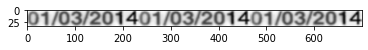

01/03/2014
63907
(17, 96)


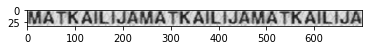

MATKAILIJA
64079
(14, 11)


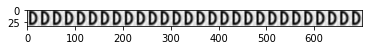

D
60995
(12, 104)


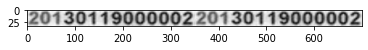

20130119000002
47716
(14, 47)


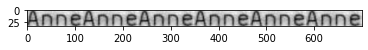

Anne
60995
(22, 130)


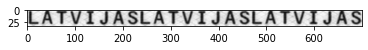

LATVIJAS
65449
(41, 1305)


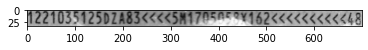

1221035125DZA83<<<<5M1705058X162<<<<<<<<<<48
47802
(30, 143)


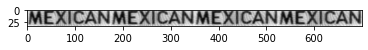

MEXICAN
49515
(12, 42)


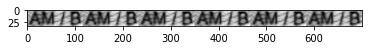

AM / B
57247
(17, 99)


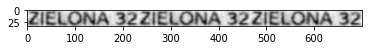

ZIELONA 32
46945
(16, 96)


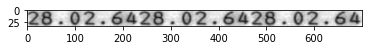

28.02.64
59881
(28, 213)


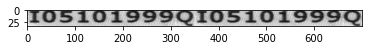

I05101999Q
64593
(11, 7)


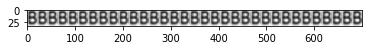

B
57504
(41, 167)


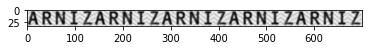

ARNIZ
55319
(21, 153)


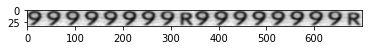

99999999R
63308
(10, 79)


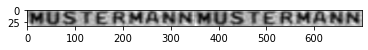

MUSTERMANN
65342
(19, 56)


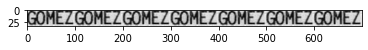

GOMEZ
59281
(33, 200)


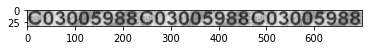

C03005988
64507
(15, 122)


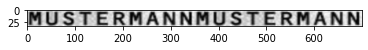

MUSTERMANN
64850
(11, 61)


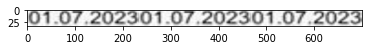

01.07.2023
56026
(27, 64)


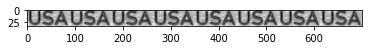

USA
59238
(34, 293)


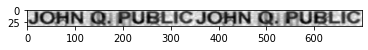

JOHN Q. PUBLIC
55191
(20, 127)


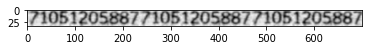

71051205887
59817
(43, 303)


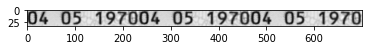

04 05 1970
56733
(19, 214)


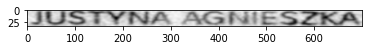

JUSTINA AGNIESZKA
61038
(22, 215)


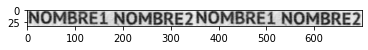

NOMBRE1 NOMBRE2
47288
(16, 132)


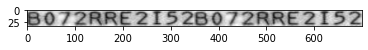

B072RRE2I52
60309
(17, 103)


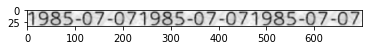

1985-07-07
54912
(22, 140)


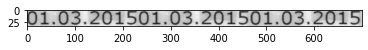

01.03.2015
59881
(19, 45)


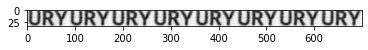

URY
61766
(21, 103)


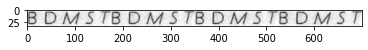

B D M S T
57825
(88, 350)


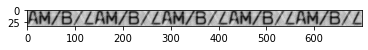

AM/B/L
55512
(14, 97)


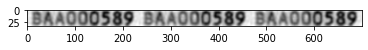

BAA000589
64336
(14, 74)


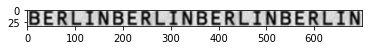

BERLIN
46860
(30, 91)


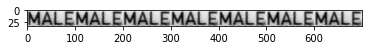

MALE
63650
(25, 179)


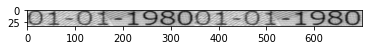

01-01-1980
65107
(14, 57)


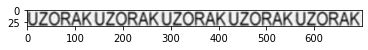

UZORAK
61680
(24, 173)


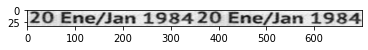

20 Ene/Jan 1984
56026
(27, 26)


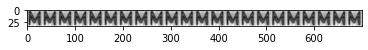

M
58853
(26, 45)


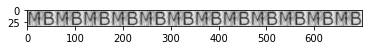

MB
55426
(22, 140)


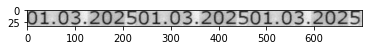

01.03.2025
51143
(18, 15)


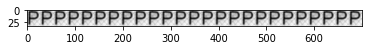

P
57375
(40, 93)


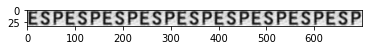

ESP
62108
(24, 178)


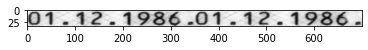

01.12.1986.
59817
(20, 123)


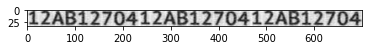

12AB12704
57654
(24, 21)


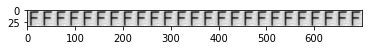

F
65364
(13, 83)


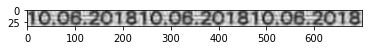

10.06.2018
64164
(36, 1305)


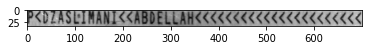

P<DZASLIMANI<<ABDELLAH<<<<<<<<<<<<<<<<<<<<<<
56883
(11, 56)


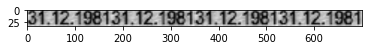

31.12.1981
64122
(21, 98)


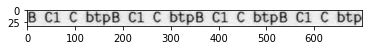

B C1 C btp
52942
(58, 437)


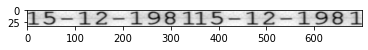

15-12-1981
61230
(22, 239)


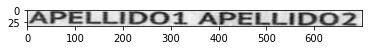

APELLIDO1 APELLIDO2
65449
(13, 85)


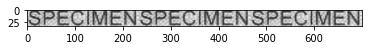

SPECIMEN
65535
(35, 168)


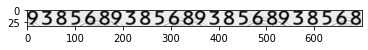

938568
52171
(22, 324)


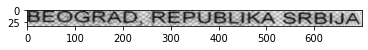

BEOGRAD, REPUBLIKA SRBIJA
58982
(31, 225)


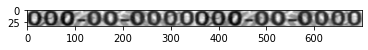

000-00-0000
58339
(28, 185)


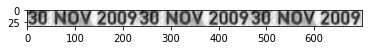

30 NOV 2009
56883
(12, 38)


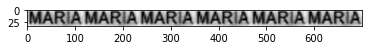

MARIA
65150
(19, 42)


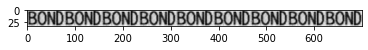

BOND
59024
(13, 46)


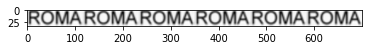

ROMA
65449
(14, 159)


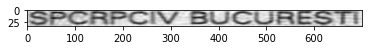

SPCRPCIV BUCURESTI
64850
(87, 772)


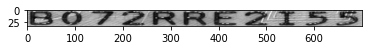

B072RRE2I55
64593
(12, 41)


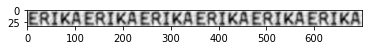

ERIKA
65449
(13, 82)


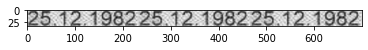

25.12.1982
59881
(15, 109)


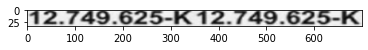

12.749.625-K
58853
(15, 53)


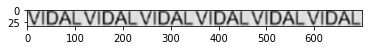

VIDAL
45232
(28, 193)


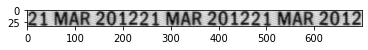

21 MAR 2012
58596
(26, 194)


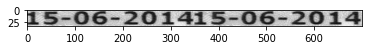

15-06-2014
54291
(14, 30)


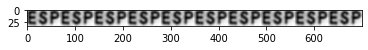

ESP
65342
(18, 57)


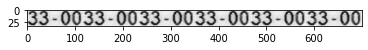

33-00
62879
(23, 172)


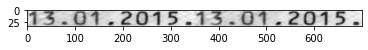

13.01.2015.
46346
(30, 105)


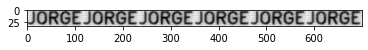

JORGE
58660
(41, 128)


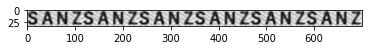

SANZ
61423
(39, 370)


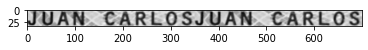

JUAN CARLOS
61423
(11, 67)


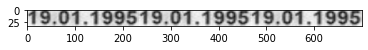

19.01.1995
56968
(13, 88)


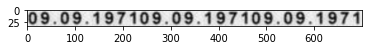

09.09.1971
65278
(18, 109)


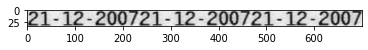

21-12-2007
58082
(13, 9)


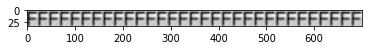

F
64764
(11, 61)


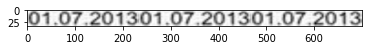

01.07.2013
64507
(15, 60)


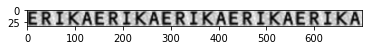

ERIKA
55640
(14, 84)


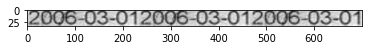

2006-03-01
49258
(18, 155)


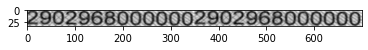

2902968000000
65535
(29, 143)


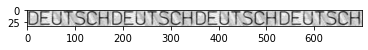

DEUTSCH
64507
(11, 21)


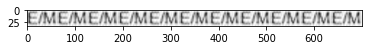

E/M
65021
(20, 441)
64507
(10, 69)


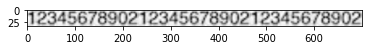

12345678902
65364
(15, 148)


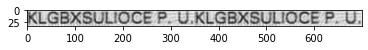

KLGBXSULIOCE P. U.
65535
(35, 254)


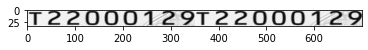

T22000129
61337
(21, 149)


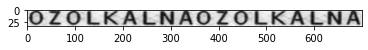

OZOLKALNA
58939
(28, 170)


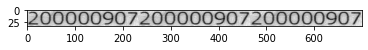

200000907
51828
(82, 557)


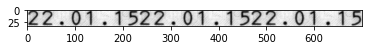

22.01.15
62023
(11, 67)


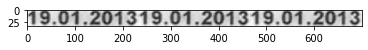

19.01.2013
54870
(20, 120)


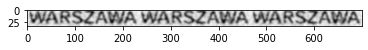

WARSZAWA
63800
(36, 960)


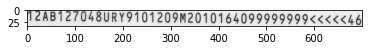

12AB127048URY9101209M2010164099999999<<<<<46
61337
(16, 196)


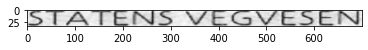

STATENS VEGVESEN
46174
(16, 132)


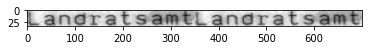

Landratsamt
61552
(21, 53)


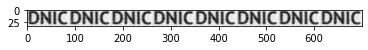

DNIC
61937
(17, 130)


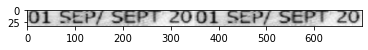

01 SEP/ SEPT 20
65364
(14, 36)


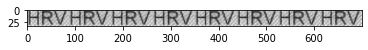

HRV
62194
(21, 117)


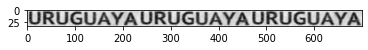

URUGUAYA
44804
(15, 48)


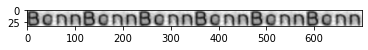

Bonn
65364
(13, 118)


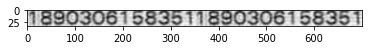

1890306158351
62794
(12, 78)


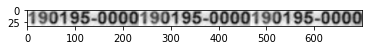

190195-0000
62794
(16, 51)


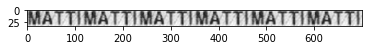

MATTI
52771
(57, 442)


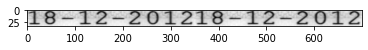

18-12-2012
50286
(18, 46)


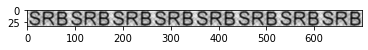

SRB
55169
(13, 57)


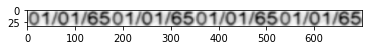

01/01/65
56968
(13, 62)


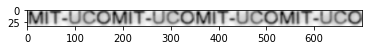

MIT-UCO
60138
(16, 78)


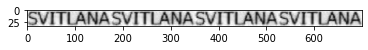

SVITLANA
64935
(18, 664)
62622
(22, 46)


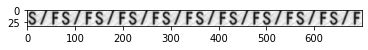

S/F
58767
(86, 558)


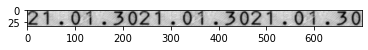

21.01.30
54141
(15, 45)


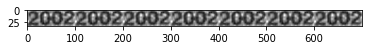

2002
64507
(10, 43)


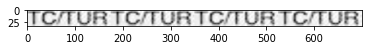

TC/TUR
53456
(76, 589)


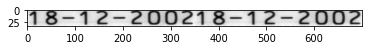

18-12-2002
65364
(14, 240)


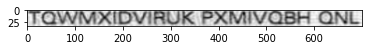

TQWMXIDVIRUK PXMIVQBH QNL
59196
(15, 34)


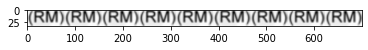

(RM)
53370
(12, 9)


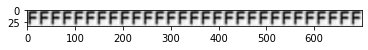

F
49944
(22, 52)


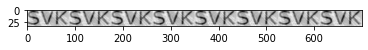

SVK
59881
(16, 7)


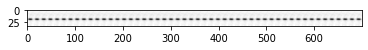

-
57996
(12, 65)


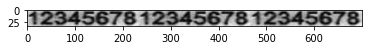

12345678
64935
(13, 83)


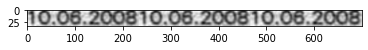

10.06.2008
64764
(16, 122)


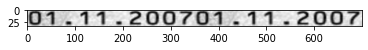

01.11.2007
58532
(14, 117)


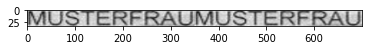

MUSTERFRAU
60481
(20, 15)


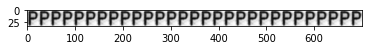

P
65535
(30, 201)


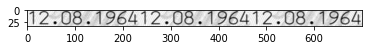

12.08.1964
62537
(16, 88)


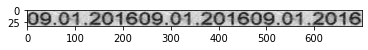

09.01.2016
58253
(28, 102)


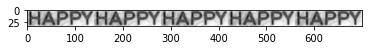

HAPPY
60309
(17, 55)


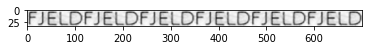

FJELD
54227
(14, 61)


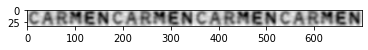

CARMEN
64079
(12, 8)


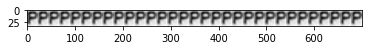

P
64421
(13, 49)


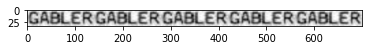

GABLER
59024
(17, 119)


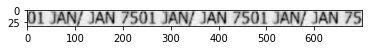

01 JAN/ JAN 75
55512
(15, 92)


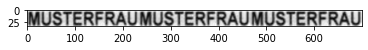

MUSTERFRAU
59367
(11, 23)


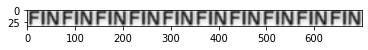

FIN
65107
(26, 22)


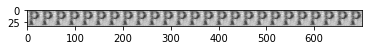

P
57247
(16, 148)


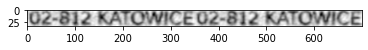

02-812 KATOWICE
60909
(19, 154)


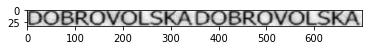

DOBROVOLSKA
57739
(13, 90)


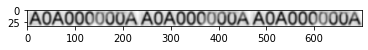

A0A000000A
59024
(28, 160)


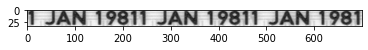

1 JAN 1981
55255
(12, 57)


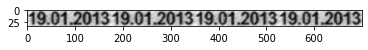

19.01.2013
57632
(41, 307)


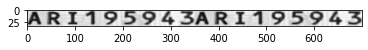

ARI195943
65278
(18, 528)
64678
(12, 91)


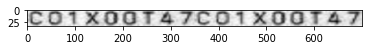

C01X00T47
62794
(16, 80)


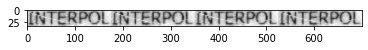

INTERPOL
58724
(21, 141)


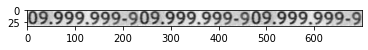

09.999.999-9
58767
(30, 76)


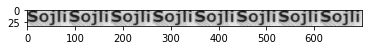

Sojli
65535
(15, 524)
62537
(12, 67)


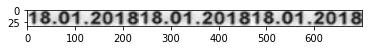

18.01.2018
49858
(18, 109)


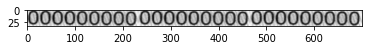

000000000
60738
(14, 55)


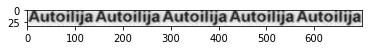

Autoilija
64700
(18, 55)


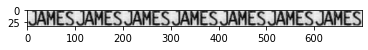

JAMES
63672
(18, 108)


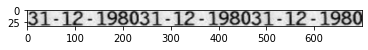

31-12-1980
59710
(29, 185)


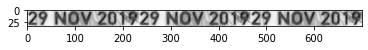

29 NOV 2019
65085
(19, 162)


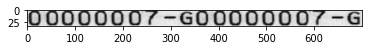

00000007-G
61337
(86, 557)


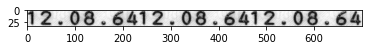

12.08.64
59967
(15, 88)


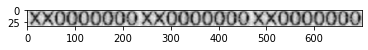

XX0000000
60481
(88, 1345)


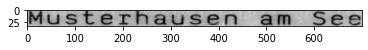

Musterhausen am See
47802
(30, 417)


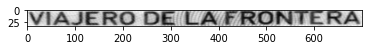

VIAJERO DE LA FRONTERA
65535
(14, 94)


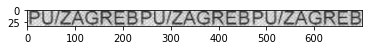

PU/ZAGREB
51143
(21, 288)


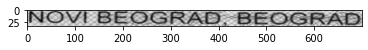

NOVI BEOGRAD, BEOGRAD
51400
(19, 58)


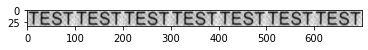

TEST
54998
(15, 118)


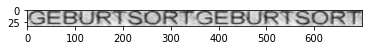

GEBURTSORT
54056
(75, 576)


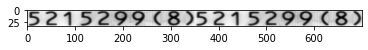

5215299(8)
63650
(86, 425)


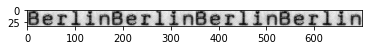

Berlin
51914
(18, 72)


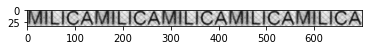

MILICA
54655
(24, 164)


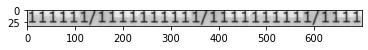

111111/1111
65535
(29, 203)


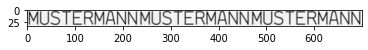

MUSTERMANN
52000
(27, 157)


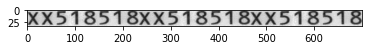

XX518518
65535
(14, 81)


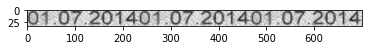

01.07.2014
52599
(19, 91)


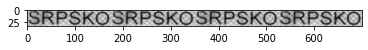

SRPSKO
62580
(19, 20)


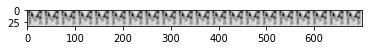

M
65535
(27, 121)


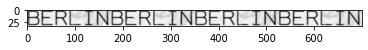

BERLIN
46688
(29, 194)


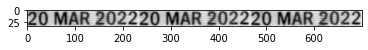

20 MAR 2022
63393
(14, 94)


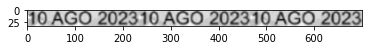

10 AGO 2023
50886
(21, 122)


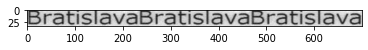

Bratislava
55855
(14, 344)
54548
(14, 83)


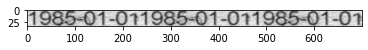

1985-01-01
65278
(27, 142)


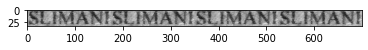

SLIMANI
56626
(58, 1005)


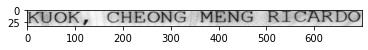

KUOK, CHEONG MENG RICARDO
65449
(16, 109)


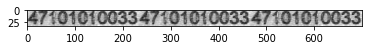

47101010033
54484
(26, 122)


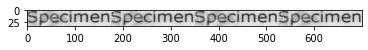

Specimen
64935
(11, 53)


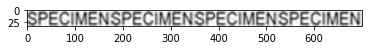

SPECIMEN
60909
(18, 134)


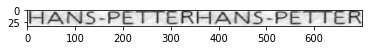

HANS-PETTER
57996
(27, 166)


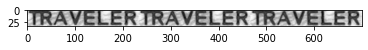

TRAVELER
64079
(16, 121)


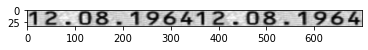

12.08.1964
55576
(19, 268)


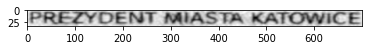

PREZYDENT MIASTA KATOWICE
64764
(11, 51)


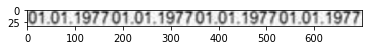

01.01.1977
55384
(19, 81)


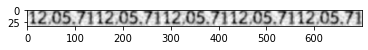

12.05.71
64421
(27, 182)


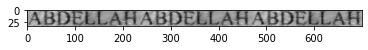

ABDELLAH
62879
(13, 92)


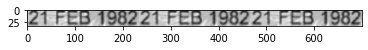

21 FEB 1982
57054
(40, 30)


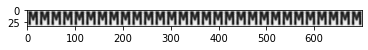

M
61337
(23, 48)


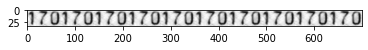

170
65535
(28, 201)


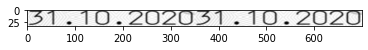

31.10.2020
63736
(17, 13)


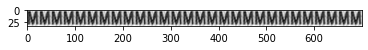

M
64935
(15, 109)


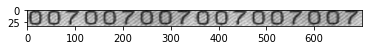

007007007
65535
(12, 78)


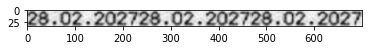

28.02.2027
54805
(18, 145)


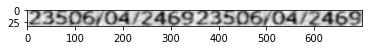

23506/04/2469
40777
(25, 125)


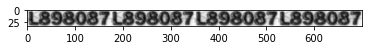

L898087
54570
(62, 171)


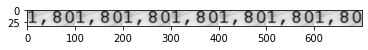

1,80
55512
(16, 103)


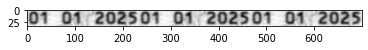

01 01 2025
61937
(15, 30)


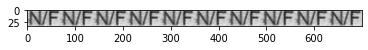

N/F
64507
(16, 85)


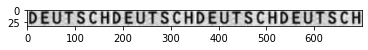

DEUTSCH
65107
(29, 945)


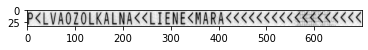

P<LVAOZOLKALNA<<LIENE<MARA<<<<<<<<<<<<<<<<<<
45660
(20, 86)


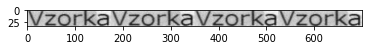

Vzorka
62451
(33, 962)


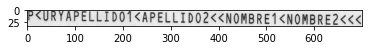

P<URYAPELLIDO1<APELLIDO2<<NOMBRE1<NOMBRE2<<<
57311
(14, 78)


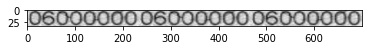

06000000
62644
(24, 172)


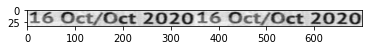

16 Oct/Oct 2020
55426
(27, 925)


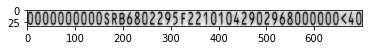

0000000000SRB6802295F22101042902968000000<40
49258
(18, 107)


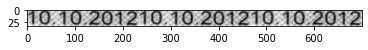

10.10.2012
54827
(46, 480)


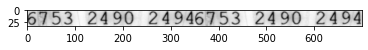

6753 2490 2494
57568
(12, 40)


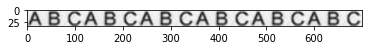

A B C
56154
(22, 101)


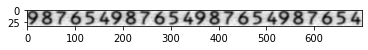

987654
56797
(12, 53)


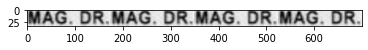

MAG. DR.
62023
(22, 190)


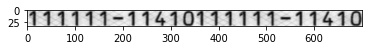

111111-11410
61680
(13, 83)


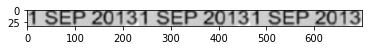

1 SEP 2013
59046
(19, 17)


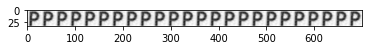

P
57825
(12, 30)


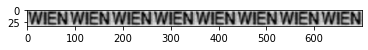

WIEN
58596
(10, 55)


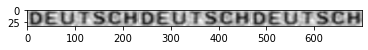

DEUTSCH
54612
(14, 64)


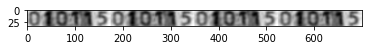

010115
64935
(13, 11)


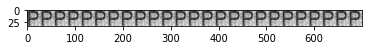

P
53285
(53, 443)


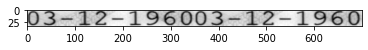

03-12-1960
56283
(23, 85)


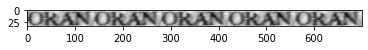

ORAN
65449
(29, 154)


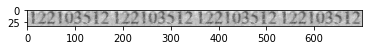

122103512
46688
(15, 145)


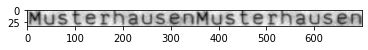

Musterhausen
63565
(23, 175)


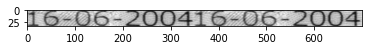

16-06-2004
48487
(15, 93)


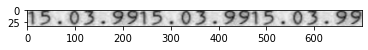

15.03.99
58339
(10, 63)


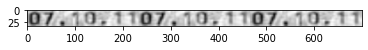

07.10.11
62879
(15, 100)


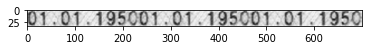

01.01.1950
65364
(15, 225)


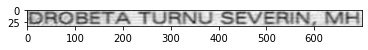

DROBETA TURNU SEVERIN, MH
62965
(17, 98)


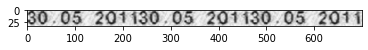

30.05 2011
50543
(20, 127)


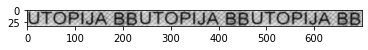

UTOPIJA BB
64507
(10, 39)


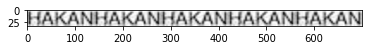

HAKAN
62108
(16, 26)


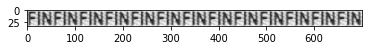

FIN
58339
(85, 773)


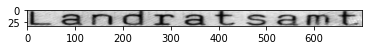

Landratsamt
43005
(27, 77)


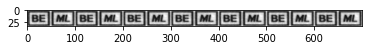

BE ML
65535
(14, 81)


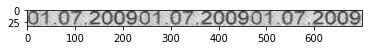

01.07.2009
64593
(14, 12)


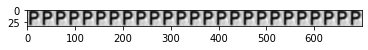

P
58660
(25, 185)


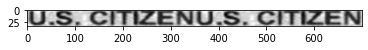

U.S. CITIZEN
65449
(13, 88)


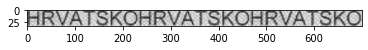

HRVATSKO
65278
(27, 69)


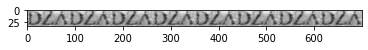

DZA
61766
(11, 9)


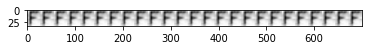

F
48659
(12, 12)


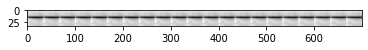

-
62794
(10, 79)


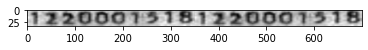

1220001518
47459
(15, 121)


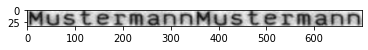

Mustermann
59046
(43, 316)


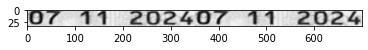

07 11 2024
61509
(15, 185)


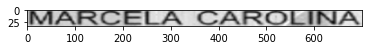

MARCELA CAROLINA
64593
(10, 54)


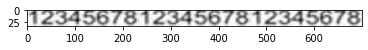

12345678
65107
(13, 56)


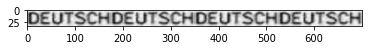

DEUTSCH
60309
(14, 69)


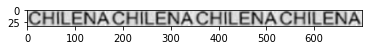

CHILENA
58767
(28, 267)


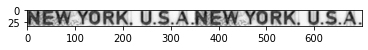

NEW YORK. U.S.A.
54356
(24, 18)


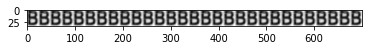

B
65535
(14, 525)
57118
(22, 210)


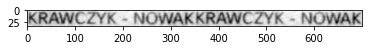

KRAWCZYK - NOWAK
59624
(28, 104)


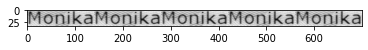

Monika
65449
(11, 79)


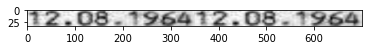

12.08.1964
56926
(15, 117)


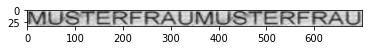

MUSTERFRAU
60823
(21, 48)


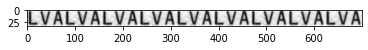

LVA
62965
(15, 98)


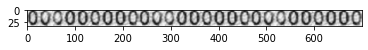

000000000
56797
(12, 56)


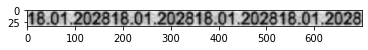

18.01.2028
65535
(28, 224)


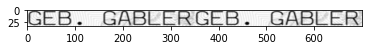

GEB. GABLER
63822
(27, 94)


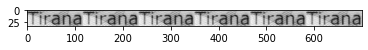

Tirana
56197
(24, 926)


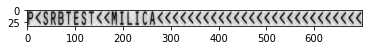

P<SRBTEST<<MILICA<<<<<<<<<<<<<<<<<<<<<<<<<<<
60823
(22, 150)


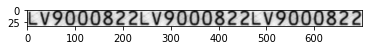

LV9000822
47117
(20, 15)


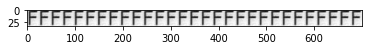

F
47117
(21, 131)


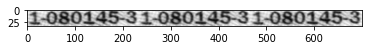

1-080145-3
56412
(28, 66)


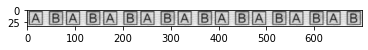

A B
64507
(10, 57)


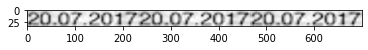

20.07.2017
58510
(16, 32)


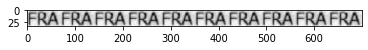

FRA
60309
(15, 71)


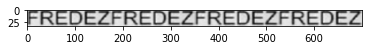

FREDEZ
65021
(28, 208)


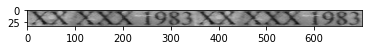

XX XXX 1983
65449
(17, 528)
65107
(12, 9)


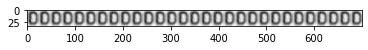

D
65449
(12, 79)


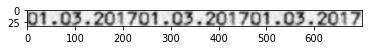

01.03.2017
64678
(13, 84)


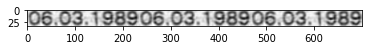

06.03.1989
51314
(22, 410)


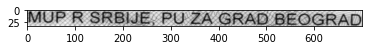

MUP R SRBIJE, PU ZA GRAD BEOGRAD
56026
(12, 43)


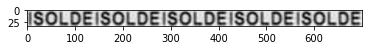

ISOLDE
51571
(83, 345)


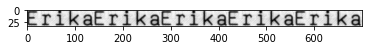

Erika
62794
(16, 41)


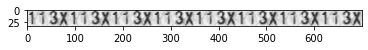

113X
60481
(14, 10)


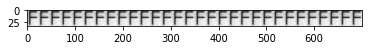

F
61766
(16, 132)


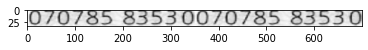

070785 83530
61851
(15, 167)


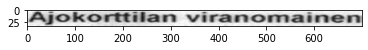

Ajokorttilan viranomainen
64250
(15, 115)


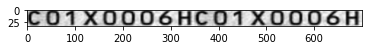

C01X0006H
55384
(17, 40)


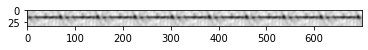

-
47202
(29, 189)


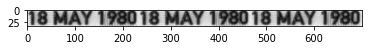

18 MAY 1980
61937
(22, 156)


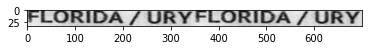

FLORIDA/URY
57911
(12, 66)


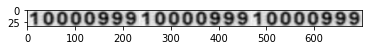

10000999
49944
(20, 107)


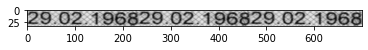

29.02.1968
55512
(15, 13)


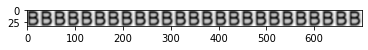

B
54655
(21, 139)


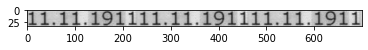

11.11.1911
64507
(10, 33)


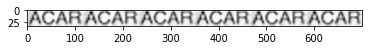

ACAR
55576
(14, 102)


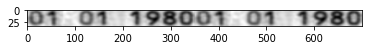

01 01 1980
61509
(12, 112)


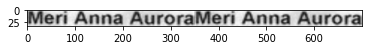

Meri Anna Aurora
56626
(13, 50)


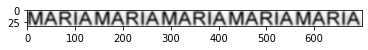

MARIA
60481
(18, 83)


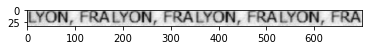

LYON, FRA
55705
(15, 38)


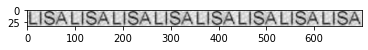

LISA
58082
(25, 200)


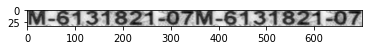

M-6131821-07
60652
(14, 10)


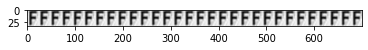

F
58682
(22, 124)


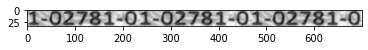

1-02781-0
54227
(50, 143)


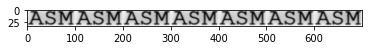

ASM
62622
(17, 103)


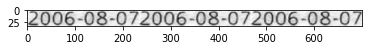

2006-08-07
58853
(14, 49)


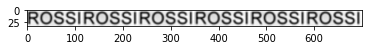

ROSSI
64507
(10, 51)


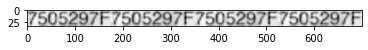

7505297F
61594
(24, 172)


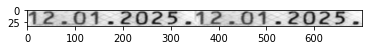

12.01.2025.
64507
(19, 110)


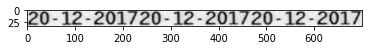

20-12-2017
62794
(13, 76)


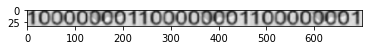

100000001
65364
(16, 87)


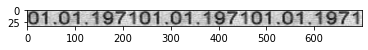

01.01.1971
65192
(13, 84)


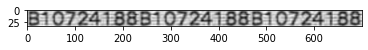

B10724188
52749
(13, 8)


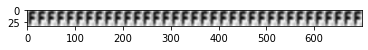

F
65449
(17, 82)


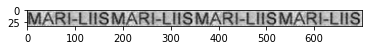

MARI-LIIS
65278
(12, 49)


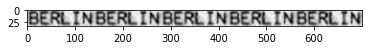

BERLIN
61252
(32, 285)


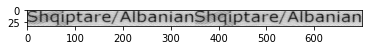

Shqiptare/Albanian
60481
(10, 62)


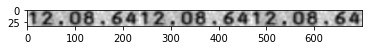

12.08.64
56968
(15, 107)


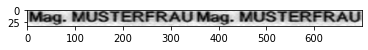

Mag. MUSTERFRAU
65192
(16, 115)


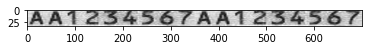

AA1234567
62772
(22, 169)


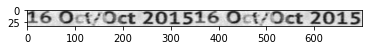

16 Oct/Oct 2015
63993
(17, 99)


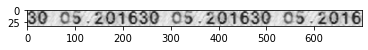

30 05.2016
61509
(86, 715)


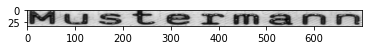

Mustermann
59624
(10, 39)


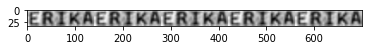

ERIKA
52771
(19, 108)


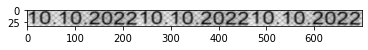

10.10.2022
65364
(18, 665)
63308
(16, 122)


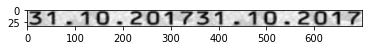

31.10.2017
65535
(27, 101)


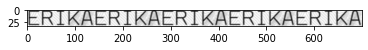

ERIKA
65364
(13, 9)


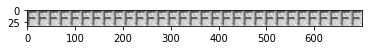

F
65449
(14, 67)


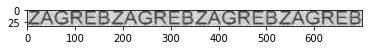

ZAGREB
55769
(18, 84)


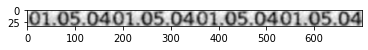

01.05.04
65364
(32, 353)


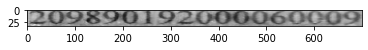

209890192000060009
63736
(16, 14)


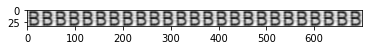

B
64507
(10, 57)


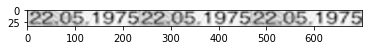

22.05.1975
65107
(12, 80)


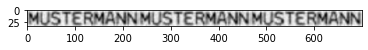

MUSTERMANN
55940
(15, 87)


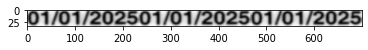

01/01/2025
56026
(14, 344)
65364
(15, 35)


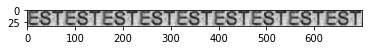

EST
61937
(17, 142)


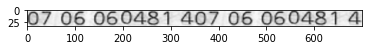

07 06 060481 4
65364
(14, 85)


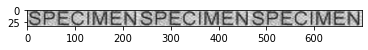

SPECIMEN
63993
(32, 943)


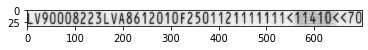

LV90008223LVA8612010F2501121111111<11410<<70


In [ ]:
label_map = {'(': 0, ')': 1, ',': 2, '.' :3, '-': 4, '/': 5, '<': 6, ' ':7}
for i in range(10):
    label_map[chr(48+i)] = 8+i
for i in range(26):
    label_map[chr(65+i)] = 18+i
for i in range(26):
    label_map[chr(97+i)] = 44+i

width = []
height = []

class SegmentaionMidv500(Dataset):

    def __init__(self, root_dir = 'datasets/midv500-textline/', process = 'resize', transform=None): #process -> resize or append
        """
        Args:
            root_dir (string): Directory with all the images.
            transform (callable, optional): Optional transform to be applied
                on a sample.
        """
        self.root_dir = root_dir        
        self.transform = transform
        self.sample_list = []
        custom_w_h = []
        with open(self.root_dir + 'ground_truth.json', 'r') as fp:
            ground_truth = json.load(fp)
        for image_name in os.listdir(self.root_dir):
            if image_name[-3:] == 'npy':
                
                flag=0
                for c in ground_truth[image_name]:
                  if c not in label_map:
                    flag = 1
                    break
                if flag ==1 or ground_truth[image_name] == '':
                  continue
                sample = {}
                # print(np.min(np.load(self.root_dir + image_name)))
                image_np = img_as_uint(np.load(self.root_dir + image_name)/255)
                print(np.max(image_np))
                height.append(image_np.shape[0])
                width.append(image_np.shape[1])
                # image_np[image_np < (np.min(image_np) + np.max(image_np))*0.5] = 0
                # image_np[image_np > (np.min(image_np) + np.max(image_np))*0.5] = np.max(image_np)
                print(image_np.shape)
                if process == 'resize' or image_np.shape[1] >=700 or 700//image_np.shape[1]==0:
                    im_resize = resize(image_np, (33,700))
                    plt.figure()
                    plt.imshow(im_resize, cmap='gray')
                    plt.show()
                    print(ground_truth[image_name])
                    sample['image'] = im_resize.reshape((1, 33, 700))
                    sample['value'] = ground_truth[image_name]
                    sample['landmark'] = -1
                    self.sample_list.append(sample)
                    custom_w_h.append([700/(len(ground_truth[image_name]))])
                elif process == 'append':
                    im2 = resize(image_np, (33, image_np.shape[1]*33//image_np .shape[0]))
                    im3 = np.zeros((33,(700//im2.shape[1])*im2.shape[1]))
                    ind = 0
                    for i in range(0, 700//im2.shape[1]):
                        im3[:, ind:ind+im2.shape[1]] = im2
                        ind += im2.shape[1]
                    try:
                      im3 = resize(im3, (33,700))
                    except:
                      continue
                    plt.figure()
                    plt.imshow(im3, cmap='gray')
                    plt.show()
                    print(ground_truth[image_name])
                    sample['image'] = im3.reshape((1,33,700))
                    sample['value'] = ground_truth[image_name]
                    sample['landmark'] = 700//im2.shape[1]
                    self.sample_list.append(sample)
                    custom_w_h.append([700/(len(ground_truth[image_name])*sample['landmark'])])
                elif process == 'middle':
                    
                    h = int((33 - image_np.shape[0]) / 2)
                    print(h)
                    if h>0:
                      im2 = np.full((33, image_np.shape[1]), np.max(image_np))
                      im2[h:h+image_np.shape[0], ] = image_np
                    else:
                      im2 = resize(image_np, (33, image_np.shape[1]))
                    im3 = np.full((33,(700//im2.shape[1])*im2.shape[1]), np.max(image_np))
                    ind = 0
                    for i in range(0, 700//im2.shape[1]):
                        im3[:, ind:ind+im2.shape[1]] = im2
                        ind += im2.shape[1]
                    try:
                      im3 = resize(im3, (33,700))
                    except:
                      continue
        output = open('custom_w_h.pkl', 'wb')
        pickle.dump(custom_w_h, output)
        output.close()


    def __len__(self):
        return len(self.sample_list)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()
        if self.transform:
            for item in range(len(self.sample_list)):
                self.sample_list[item] = self.transform(self.sample_list[item])
        return self.sample_list[idx]


class ToTensor(object):
    """Convert ndarrays in sample to Tensors."""

    def __call__(self, sample):
        image, landmarks, val = sample['image'], sample['landmark'], sample['value']

        # swap color axis because
        # numpy image: H x W x C
        # torch image: C X H X W
        
        #image = image.transpose((2, 0, 1))
        if not torch.is_tensor(image):
            image = torch.from_numpy(image)
        if not torch.is_tensor(landmarks):
            landmarks = torch.tensor(landmarks)
        return {'image': image,
                'landmark': landmarks, 'value': val}

test_dataset = SegmentaionMidv500('midv500-textline/', process='append', transform=transforms.Compose([ToTensor()]))

In [ ]:
print(np.min(width), np.max(width), len(width))
print(np.min(height), np.max(height), len(height))

7 1345 336
10 88 336


In [ ]:
a = np.zeros((2,3))
a = 1.0
a

1.0

In [ ]:
len(test_dataset)

327

In [ ]:
loader_test = DataLoader(test_dataset,batch_size = len(test_dataset))

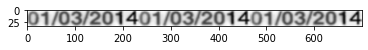

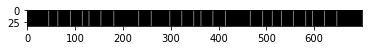

01/03/2014 -> mw3y/2mwmw
01/03/2014 -> m0ww3yx/2mmwm
01/03/2014 -> m0ww3yx/2mmwm


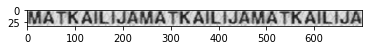

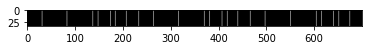

MATKAILIJA -> MMuWuLuWJAM
MATKAILIJA -> MMulWuLuWWJ/A
MATKAILIJA -> MMulWuLuWWJ/A


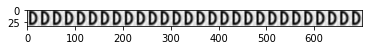

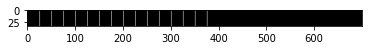

D -> Dn
D -> Dn
D -> Dn


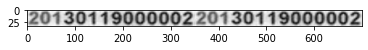

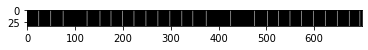

20130119000002 -> M19xwwmmM
20130119000002 -> M1mN9xwowwowwo0wm0mM
20130119000002 -> M1mN9xwowwowwo0wm0mM


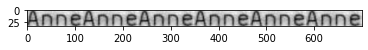

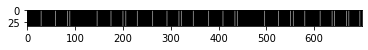

Anne -> nmmnun
Anne -> nmmnunm
Anne -> nmmnunm


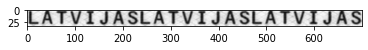

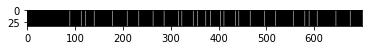

LATVIJAS -> w4IuASxWww
LATVIJAS -> vvw4IJuAKSxW
LATVIJAS -> vvw4IwJuAKSxW


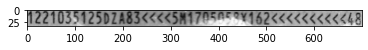

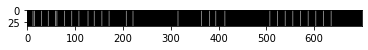

1221035125DZA83<<<<5M1705058X162<<<<<<<<<<48 -> m  3xHmmmWW8m A<Ww<(<<<
1221035125DZA83<<<<5M1705058X162<<<<<<<<<<48 -> mm  w Toow3xmHmTwmm3WW8mm A<Ww(w<(<<<
1221035125DZA83<<<<5M1705058X162<<<<<<<<<<48 -> mm  w Toow3xmH5mTwmm3WW8mm A<Ww(w<(<<<


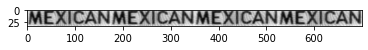

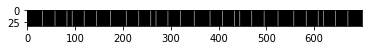

MEXICAN -> xkvcMA
MEXICAN -> amxRkvcMAM
MEXICAN -> amxRkvcMAM


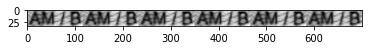

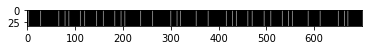

AM / B -> AMwM/
AM / B -> AMwM/
AM / B -> AMwBMM/


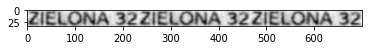

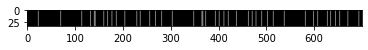

ZIELONA 32 -> t32zu
ZIELONA 32 -> t GJ32zui
ZIELONA 32 -> tp   GjJ32zuF


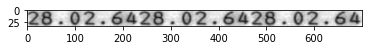

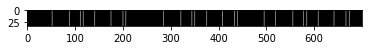

28.02.64 -> , 2x2, 6
28.02.64 -> , ou2x2n, 6
28.02.64 -> ,  ou2x2n, X6


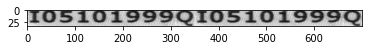

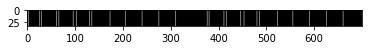

I05101999Q -> IInw55a11iw0D99
I05101999Q -> IInw55a1n1iw0xiD99
I05101999Q -> IInwSS55a1n1iw0xiD99


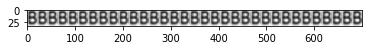

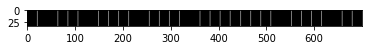

B -> W
B -> WB
B -> WB


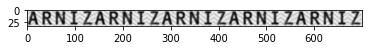

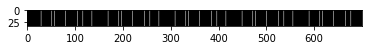

ARNIZ -> RMnmm
ARNIZ -> RMnmNmv
ARNIZ -> RMnmnNmv


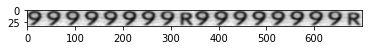

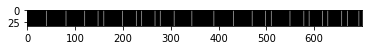

99999999R -> 999999999999 9
99999999R -> 999999999999 f9
99999999R -> 99 9999w99j999 )9 f9


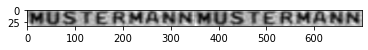

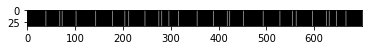

MUSTERMANN -> UWmRRMMAMWM
MUSTERMANN -> UWmRRMMAmMiWMW
MUSTERMANN -> UjWJFJmRRMMAmWMWiWMW


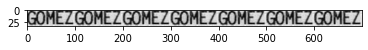

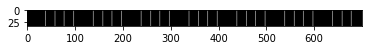

GOMEZ -> MmEm
GOMEZ -> MmEmm
GOMEZ -> MkmEmm


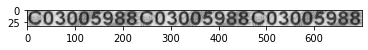

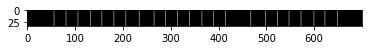

C03005988 -> 3xwwxw5sxawx
C03005988 -> 3xww0xw5sxawx
C03005988 -> 3xww0xw5sWxaw


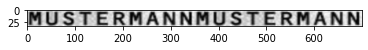

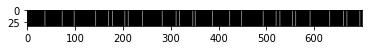

MUSTERMANN -> UWSwERRMRnANNmMM
MUSTERMANN -> UWSwERRMRnAAmNNmmWM
MUSTERMANN -> UWSwERRMRMnAAmNNmmWM


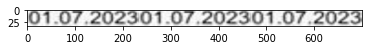

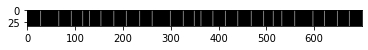

01.07.2023 -> 7xao23xx
01.07.2023 -> u7 mxaow2x3xn
01.07.2023 -> u07 mxaow2x3x


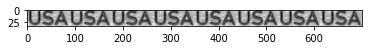

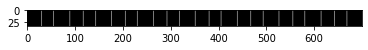

USA -> SUwS
USA -> SMuUw
USA -> SMuUw


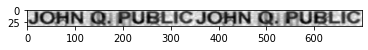

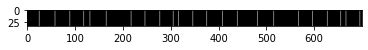

JOHN Q. PUBLIC -> uHmnmQpBhLuwJ
JOHN Q. PUBLIC -> uHmnMmQpUBhWLuMcw
JOHN Q. PUBLIC -> 0uHmnMmQpUwBhWLuMcwJ


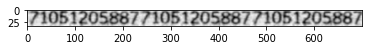

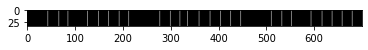

71051205887 -> 5px  885
71051205887 -> 05Wpox 5x 8w8
71051205887 -> 05WpWox 5x 8w


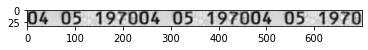

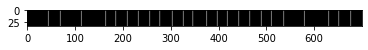

04 05 1970 -> w1j9x 7nM0w
04 05 1970 -> iw1j9x 7nM0wo
04 05 1970 -> iw1j9x 7nM0wo


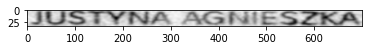

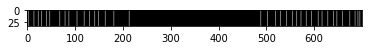

JUSTINA AGNIESZKA -> JWvLUJSSyy/3sS,7z7j<(J
JUSTINA AGNIESZKA -> JWvLUUJ(<SSyy/k3sS,7.zz7na jl<(JJ/
JUSTINA AGNIESZKA -> JWvVLUUJ(<SSyyM/k3sS,7.zz7Zna jl<(JJ//


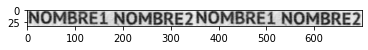

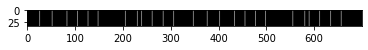

NOMBRE1 NOMBRE2 -> MWmBm R06WMqBm
NOMBRE1 NOMBRE2 -> oWMWmBm RH06WMwqBmm
NOMBRE1 NOMBRE2 -> oWMWmBm RH06WMwWqBmm


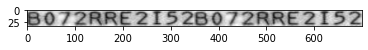

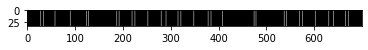

B072RRE2I52 -> v0nu22Bx5x2x
B072RRE2I52 -> vv0 nuu22iBx5x2xx
B072RRE2I52 -> vv0 nuu22iIBBx5x2xx2


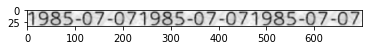

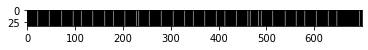

1985-07-07 -> 9xWm7.0wm9
1985-07-07 -> 9xW0m7.0uwm9
1985-07-07 -> 9xWW0m7.0uwm9


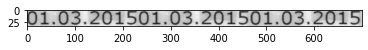

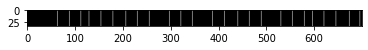

01.03.2015 -> 3,2mWk5xom
01.03.2015 -> w3,2mW1k5xomo
01.03.2015 -> w3,2mW1k5xomo


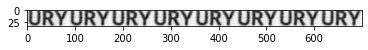

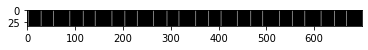

URY -> UfRyY
URY -> UfRyY
URY -> UfRyY


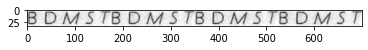

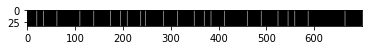

B D M S T ->  pDJnBn
B D M S T ->  pD JnBv
B D M S T ->  pDV JnWBv


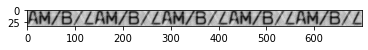

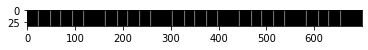

AM/B/L -> M/BM
AM/B/L -> Mwu/ABM
AM/B/L -> Mwu/ABWv


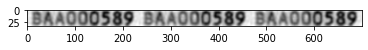

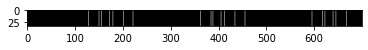

BAA000589 ->  3553y8y0
BAA000589 -> 0v 35X553y8
BAA000589 -> 0vx 35X55X3y8


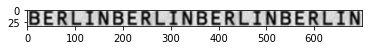

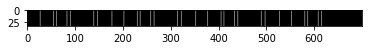

BERLIN -> EEaaRNwBx
BERLIN -> EEaaRNwBx
BERLIN -> EEaaRuNwBx


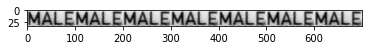

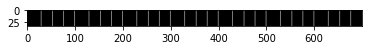

MALE -> ALW
MALE -> ALEpWW
MALE -> ALEpWW


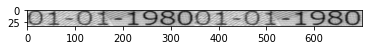

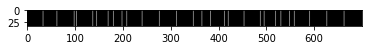

01-01-1980 -> 1i4I19S8wo(o
01-01-1980 -> 1iF omi4I19S8wox(
01-01-1980 -> 1iF oomWi44I19S8wox(


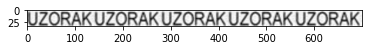

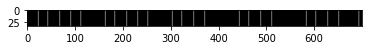

UZORAK -> zM0Rz
UZORAK -> znM0vRWz
UZORAK -> znM0vRWu


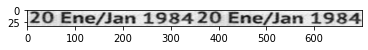

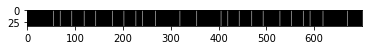

20 Ene/Jan 1984 ->  IMEne4mamnn1n
20 Ene/Jan 1984 ->  IMEhnwev4mamnnn1Wn
20 Ene/Jan 1984 ->  IMEhfnwev4mamnnn1Wn


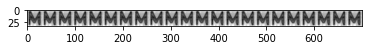

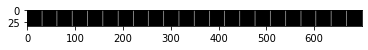

M -> MM
M -> MW
M -> MW


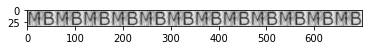

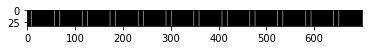

MB -> Wf
MB -> ffW
MB -> ffrW


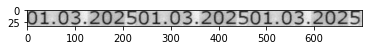

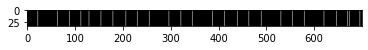

01.03.2025 -> Lo32xW2xa5
01.03.2025 -> Lo32jxoW2xa5
01.03.2025 -> Low32jxoW2xa5


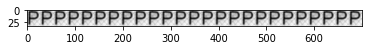

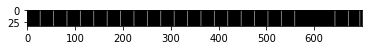

P -> P
P -> P
P -> Pp


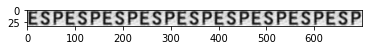

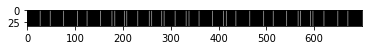

ESP -> sxss
ESP -> spxm
ESP -> spxmA


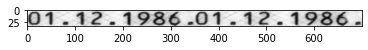

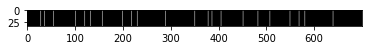

01.12.1986. -> 1w1N,a1w2N.11xx0m
01.12.1986. -> 1w1N,a1wp2N.a11xx00
01.12.1986. -> 1w1N,a1wp2N. a11xx00


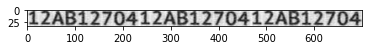

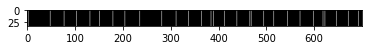

12AB12704 -> pABmpv7no4
12AB12704 -> pABmpvA7no4a
12AB12704 -> pA BmpvA7no4a


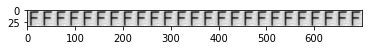

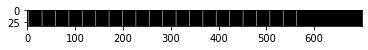

F -> F
F -> F
F -> Ff


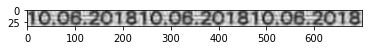

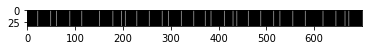

10.06.2018 -> puoMM1MMup
10.06.2018 -> epouoMM1M8Mu
10.06.2018 -> expoeuoMM1M8M


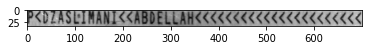

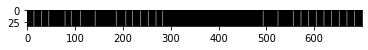

P<DZASLIMANI<<ABDELLAH<<<<<<<<<<<<<<<<<<<<<< -> <mmWHwawABxW<<W<((<<
P<DZASLIMANI<<ABDELLAH<<<<<<<<<<<<<<<<<<<<<< -> <pm mxlWHwawABm0xW<<WW<(W(<<<
P<DZASLIMANI<<ABDELLAH<<<<<<<<<<<<<<<<<<<<<< -> <pm nmmx0lWHwWawAhBm0xW<<<WW<(Wx(R<<x<


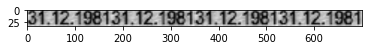

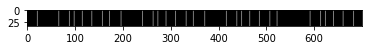

31.12.1981 -> 2 419xW
31.12.1981 -> R2Nj 419xW
31.12.1981 -> R2Nj 419xW


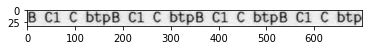

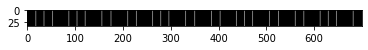

B C1 C btp -> xc1HK p 
B C1 C btp -> xc1HK p 
B C1 C btp -> xc1HK uup 


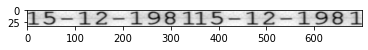

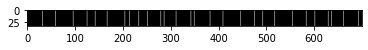

15-12-1981 -> 5.Lp2.1v99x88nn5
15-12-1981 -> 5x.Lp2.1Ev99x88nn5
15-12-1981 -> 5x.Lp2.91Ewv99x88nnq


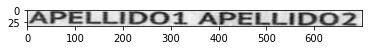

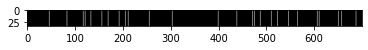

APELLIDO1 APELLIDO2 -> PEEHLuuLLuIp0PEEHLuL.LuDD22
APELLIDO1 APELLIDO2 -> PxEEHaLuuLLuuIp0P4EEHHLuL.lLuDD)22
APELLIDO1 APELLIDO2 -> PxEEHalLuuLLuuIp0P4EEHHILuL.lLu4iDD)22


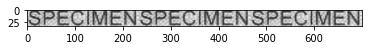

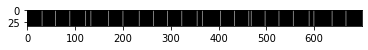

SPECIMEN -> PEWCMEN8E
SPECIMEN -> PEWCWMfEANk8
SPECIMEN -> P4ExWCWMfEANk


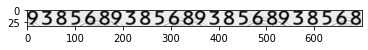

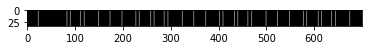

938568 -> x35x5gg89x
938568 -> x35x5gg89x
938568 -> x35x5gg89x


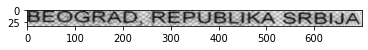

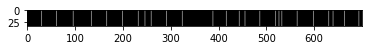

BEOGRAD, REPUBLIKA SRBIJA -> EwGRMAD REnBMRKMAK3SxRBmWA
BEOGRAD, REPUBLIKA SRBIJA -> EwOGRMAoDm fREnBMwRMKMuAK3SxRBmWJA
BEOGRAD, REPUBLIKA SRBIJA -> EwOGxRMAoD4m fREnBMwRMKMuAK38SxRnBmWJA


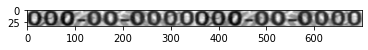

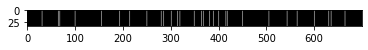

000-00-0000 -> o0w-0ww00xwowpow(
000-00-0000 -> o0wu-0ww00xwowpowOn(
000-00-0000 -> o0wu-0ww00xwowpowOn(


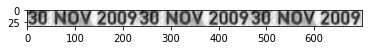

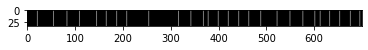

30 NOV 2009 -> WNovwnooWxo
30 NOV 2009 -> WNoWvwnooWxW
30 NOV 2009 -> vWNoWvwnmowoW


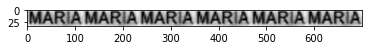

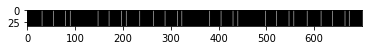

MARIA -> ARWWA
MARIA -> AMmRWW
MARIA -> AMmRWWN


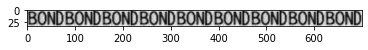

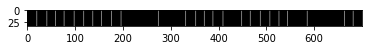

BOND -> oMN
BOND -> oMxN
BOND -> oMxNp


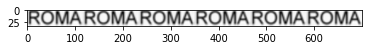

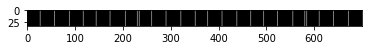

ROMA -> owMMR
ROMA -> owMMRno
ROMA -> owMmMRn


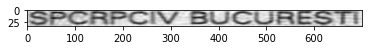

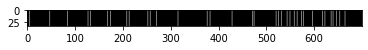

SPCRPCIV BUCURESTI -> SPccRvPPcaCNUCUURRxxEEE<SS99
SPCRPCIV BUCURESTI -> SPccRvPPccaCiNUUCCUURRxvxEEE Z<SSS99
SPCRPCIV BUCURESTI -> SPccRvPPccaCiNUUCCUURRxvxEEEE Zf<SSS99


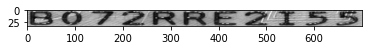

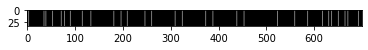

B072RRE2I55 -> BBm v() 227 RRR RR EEE 7IFJ35
B072RRE2I55 -> EEBBm v(O) 5227 RRR RRR EEE 7IFJ355s
B072RRE2I55 -> EEBBm v(O6) 5227 RRR RRR EEE 7IFJ3553s


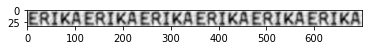

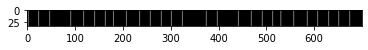

ERIKA -> ERR4F
ERIKA -> ERR4F
ERIKA -> ERTR4fF


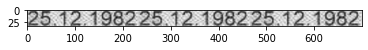

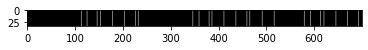

25.12.1982 -> 1j1s9xW8p1f
25.12.1982 -> 1j1ws9xW8wp1f
25.12.1982 -> 1j1ws9xW8wp1f


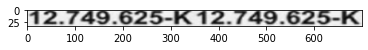

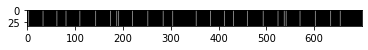

12.749.625-K -> 2n4w99x62x5.K
12.749.625-K -> w2j5n4w99xx462x5y.xK
12.749.625-K -> w2j5n4w99xx462x5y.xK


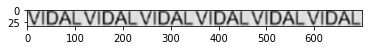

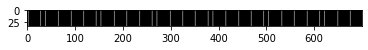

VIDAL -> wpDMAi
VIDAL -> wpDMAiW
VIDAL -> wpDMAiW


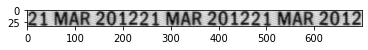

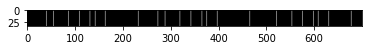

21 MAR 2012 -> MWAmRmRw22w
21 MAR 2012 -> TMWwAmRmRRw22
21 MAR 2012 -> TMWwAmRmRRw22


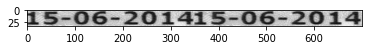

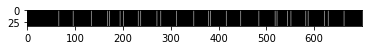

15-06-2014 -> -w0--22mnoouNN41
15-06-2014 -> -w0w(--22mnoo0uiNN41
15-06-2014 -> -w0w(--22mnoo0uiNN41


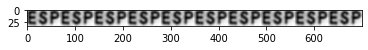

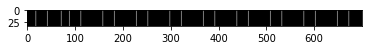

ESP -> x
ESP -> smx
ESP -> svmx


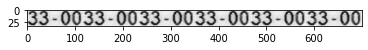

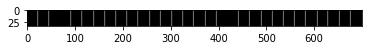

33-00 -> 33ox
33-00 -> 3w3oxw3
33-00 -> 3w3oxw3


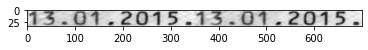

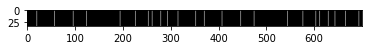

13.01.2015. -> 3ao2nomM1w1 35,7
13.01.2015. -> 3.ao2nomM1w1 35,73
13.01.2015. -> 3u.ao2nomM1w1K 35,73


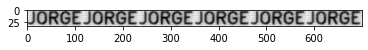

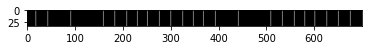

JORGE -> wmuRmG
JORGE -> owmuRmG
JORGE -> owmuRmG


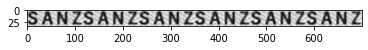

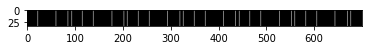

SANZ -> aMns
SANZ -> aMnrsx
SANZ -> aMMnrsx


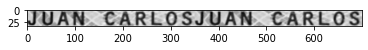

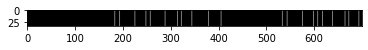

JUAN CARLOS -> vRRnLuwLWxssWJA
JUAN CARLOS -> jvRRnLuwLnW06xssWJA
JUAN CARLOS -> jvRRRnLuwLnW06xsjsWJ


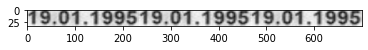

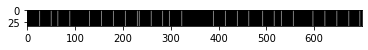

19.01.1995 -> 9.wM9x9x55M1f
19.01.1995 -> 9.wM9x9x55M1f
19.01.1995 -> 9.wM9x9x55M1f


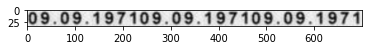

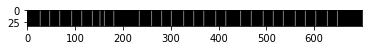

09.09.1971 -> 9 94 199x
09.09.1971 -> 9, x9, 4 19Y9
09.09.1971 -> 9, x9, 4 19Y9


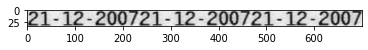

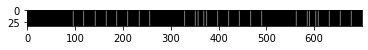

21-12-2007 -> a2owoww7 x
21-12-2007 -> a2xNowoww7 x
21-12-2007 -> N2a2xNowoww7 


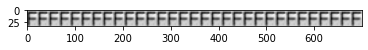

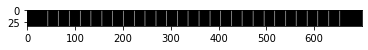

F -> FW
F -> FW
F -> FW


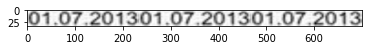

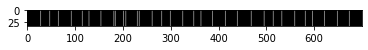

01.07.2013 -> fw7220mMf
01.07.2013 -> fmwo7n22o0mMW
01.07.2013 -> fmwo7n22o0mMW


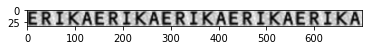

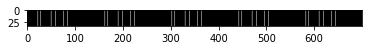

ERIKA -> RRMRn
ERIKA -> RRMRn1Ir
ERIKA -> RRMRn1Ir


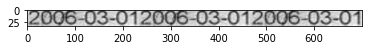

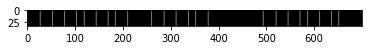

2006-03-01 -> owxW6(W
2006-03-01 -> owxW6( WoWo
2006-03-01 -> owoxW6( -Wy.o


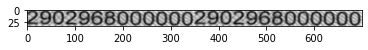

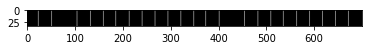

2902968000000 -> 9w9x68w0ww0ww0
2902968000000 -> 9w9x6W8wow0w0w0w0w0p
2902968000000 -> 9w9x6W8wow0w0w0w0w0p


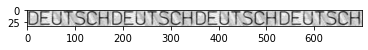

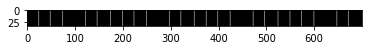

DEUTSCH -> EEcmH
DEUTSCH -> EWEbcmH
DEUTSCH -> EWEbNcmxHn


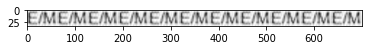

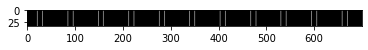

E/M -> RwWW
E/M -> RwWW
E/M -> RwWW


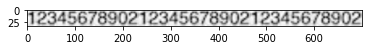

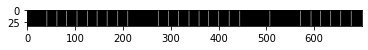

12345678902 -> 34  789x
12345678902 -> 34 x 7 89xo
12345678902 -> 3V44 x 7 k8W9


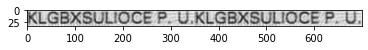

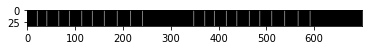

KLGBXSULIOCE P. U. -> LGuaBxKxuwxu
KLGBXSULIOCE P. U. -> LwfGuaBWxXKWSxUWuwxu
KLGBXSULIOCE P. U. -> LwfGuaBWxXKWSxUWuwxu


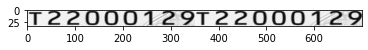

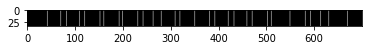

T22000129 -> 2n227omoo1r2rv9
T22000129 -> 2rnp227omoo1ir27rv9W
T22000129 -> 2rnp227omoo1ir27rv9W


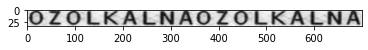

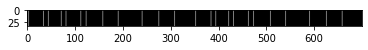

OZOLKALNA -> zzZluuNMA
OZOLKALNA -> zzZRooluAluNMAo
OZOLKALNA -> ozzZRo60oxtluAluNMAh


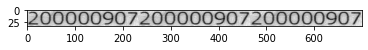

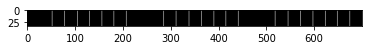

200000907 -> 0w0ww09x00w
200000907 -> 00w0ww0w9x00w
200000907 -> 00w0ww0w9x00w


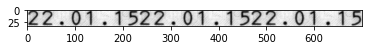

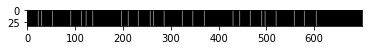

22.01.15 -> 22 o1522
22.01.15 -> 2N2V o13522
22.01.15 -> 2N2 V Wow135z


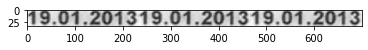

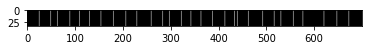

19.01.2013 -> 9.wu22o19x
19.01.2013 -> 9xw.wu22oMw19
19.01.2013 -> 9xw.wu22oMw1u


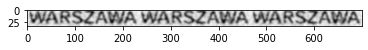

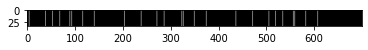

WARSZAWA -> wW/AMxxzn 
WARSZAWA -> wW/AMm3xxzn w
WARSZAWA -> wW/AMm3xxz n 


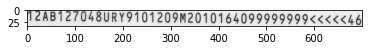

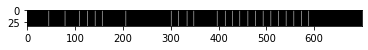

12AB127048URY9101209M2010164099999999<<<<<46 -> Mm48W9w9w    9wg 9w 9w 9w 9w9
12AB127048URY9101209M2010164099999999<<<<<46 -> Mm 48W9RmWw09w    9wg 9wg 9wg 9w 9w9
12AB127048URY9101209M2010164099999999<<<<<46 -> Mm 48W9mMRmWw09w    9wg 9wg 9wg 9w 9w9


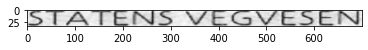

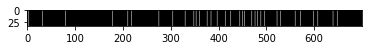

STATENS VEGVESEN -> STEES vFtEEE(((GGGG0VEEsSSStEE
STATENS VEGVESEN -> STEES WvFFtEEE,6(((GGGG0VVVEE6sSSStEEE
STATENS VEGVESEN -> STEES WvFFtEEE,6(((GGGG0VVVEE6sSSStEEE


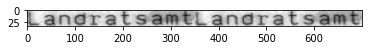

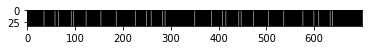

Landratsamt -> aamnnygu,L9aau
Landratsamt -> aamnnnygau,L9aaau
Landratsamt -> aamnnmnygaTu,Lk9aaau


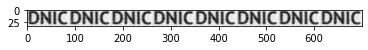

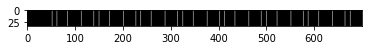

DNIC -> apMN
DNIC -> aa pM
DNIC -> aa pM


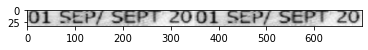

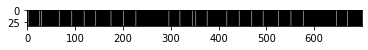

01 SEP/ SEPT 20 -> BxEP/SxZn0
01 SEP/ SEPT 20 -> BkSxEP/SxEZn00
01 SEP/ SEPT 20 ->  BkSxWEDPV/6SxEmZn00


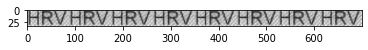

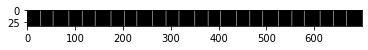

HRV -> RwR
HRV -> RNvwr
HRV -> RNvwr


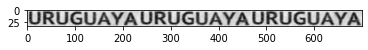

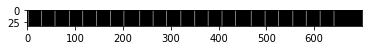

URUGUAYA -> URNUwGamAu
URUGUAYA -> URNUwGaumAuuu
URUGUAYA -> URNUwGaumAuuu


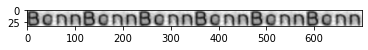

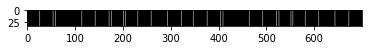

Bonn -> gmmBxg
Bonn -> gmmBxg
Bonn -> gmmB4xg


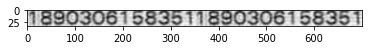

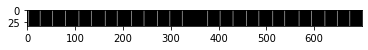

1890306158351 -> i8x9xx3wox6M1w585
1890306158351 -> i8x9xx3wox6M1w58x5n
1890306158351 -> i8x9xOx3wox6M1w58x5n


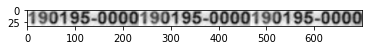

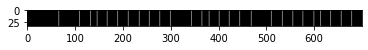

190195-0000 -> <-4nwononm
190195-0000 -> M<-4j0nwononm
190195-0000 -> M<-4j0nwononm


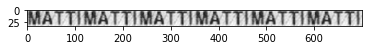

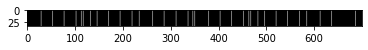

MATTI -> AMmNwMM
MATTI -> AMmNwMM
MATTI -> AMmNwMM


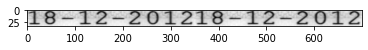

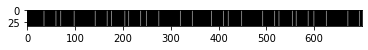

18-12-2012 -> 88r2-  2227u2n
18-12-2012 -> 88r2--  22227tu2ni
18-12-2012 -> 88r2--  22227t0uL2ni


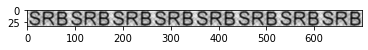

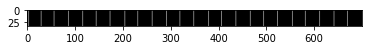

SRB -> SRns
SRB -> SRns
SRB -> S8RnN


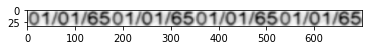

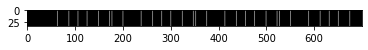

01/01/65 -> 0w)6xW5
01/01/65 -> 0w )6xxW5
01/01/65 -> 0wL )6xxW5


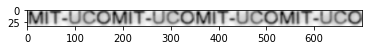

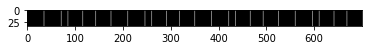

MIT-UCO -> m- wwWM
MIT-UCO -> hm- wcwWM
MIT-UCO -> hm- wcwoWM


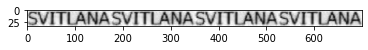

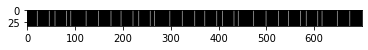

SVITLANA -> VVfNAm
SVITLANA -> VVwfmNWAm
SVITLANA -> VVwfmNWA8m


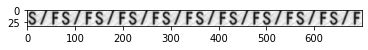

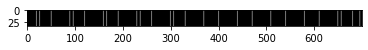

S/F -> /km
S/F -> /Mkm
S/F -> /Mkm


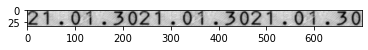

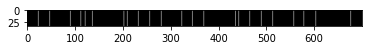

21.01.30 -> wovn1jvom
21.01.30 -> w.ovn1jjvxowm
21.01.30 -> w.ovn1jjvxowm


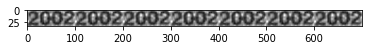

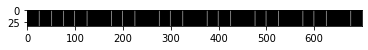

2002 -> w292m
2002 -> wu292m
2002 -> wuo292


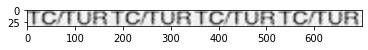

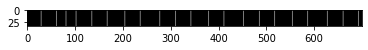

TC/TUR -> M4WRMJw
TC/TUR -> CM4WWVfRMJ
TC/TUR -> CM4WWVfRMJ


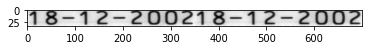

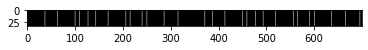

18-12-2002 -> 8k2r---222gmoyn
18-12-2002 -> 8wk22r---2227gw0moyn
18-12-2002 -> 8wk22r---2227gw0moyn


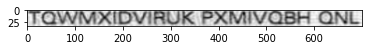

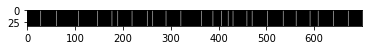

TQWMXIDVIRUK PXMIVQBH QNL -> WWpmWW(Pp)Xu(WMMAvQuHm QN
TQWMXIDVIRUK PXMIVQBH QNL -> QWWXpmWRNUW(uPp)xXu(WMMAvvQuBHHm QmN
TQWMXIDVIRUK PXMIVQBH QNL -> QWWXpmWVRNUW(uPpx)xXu(WMMAvvQuBHHm QmN


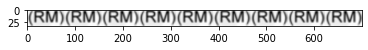

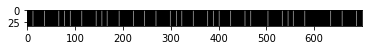

(RM) -> RMF
(RM) -> RMFf
(RM) -> RNMwj


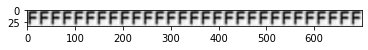

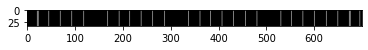

F -> 4
F -> F4
F -> F4


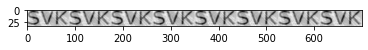

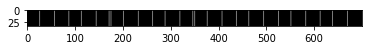

SVK -> KS
SVK -> VWKKS
SVK -> VWKKS


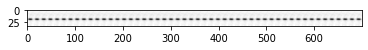

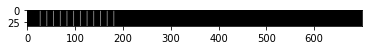

- -> .
- -> .
- -> .


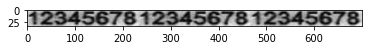

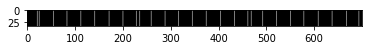

12345678 -> x23x4w5x6w7
12345678 -> x2x3x4w5x6w7w
12345678 -> x2x3x4w5x6w7w


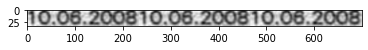

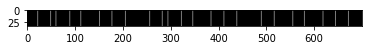

10.06.2008 -> WM6  fo 
10.06.2008 -> oWbMo6  fowo
10.06.2008 -> oWbMo6  fowoa


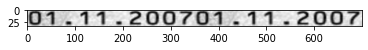

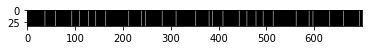

01.11.2007 -> 1..V 11N22woo7n
01.11.2007 -> 1N..V 111NN22woxo7nn
01.11.2007 -> 1N..V 111NN22woxo7nn


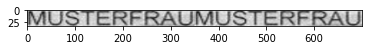

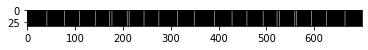

MUSTERFRAU -> UwTERRvFRMAUW
MUSTERFRAU -> UwS TERRvFRMAUW
MUSTERFRAU -> UwS TlEERRRvFRRMAyUW


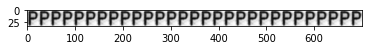

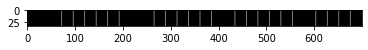

P -> pW
P -> pW
P -> pW


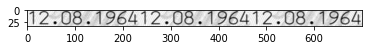

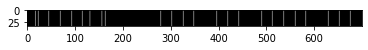

12.08.1964 -> x,8W,o8w
12.08.1964 -> ux4, ow8yWw 
12.08.1964 -> ux4,Q ow8yWw 


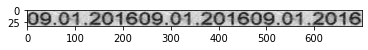

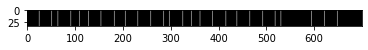

09.01.2016 -> 9r2420Mm1w
09.01.2016 -> 9wr242N0Mm1w
09.01.2016 -> 9ywr242N0Mm1w


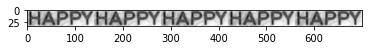

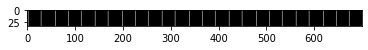

HAPPY -> HmAvPPh
HAPPY -> HmAvPPh
HAPPY -> HmAvPrPh


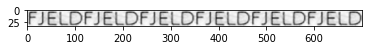

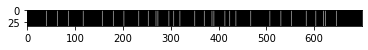

FJELD -> awDW
FJELD -> amwDWD
FJELD -> amwDWDx


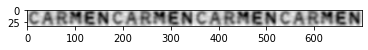

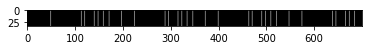

CARMEN -> ftEu 
CARMEN -> MftEEuAM 
CARMEN -> MftEEuIAM 


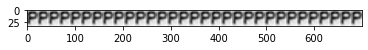

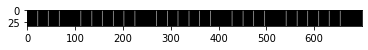

P -> P
P -> P
P -> FP


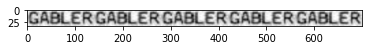

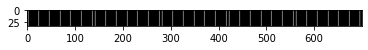

GABLER -> m8LuWF
GABLER -> wm8LuWF
GABLER -> wm8LuWFw


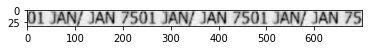

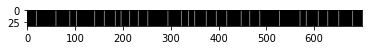

01 JAN/ JAN 75 -> w AWwxoWD
01 JAN/ JAN 75 -> w AWwA5xoWD
01 JAN/ JAN 75 -> Hw AWwA35xoWD


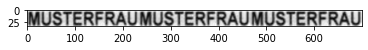

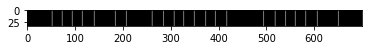

MUSTERFRAU -> STEWUWW
MUSTERFRAU -> SJWTVEmuWUW
MUSTERFRAU -> SJWTLVEmuWUWW


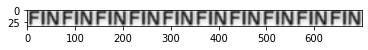

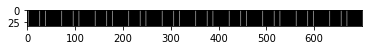

FIN -> FHN
FIN -> FHN
FIN -> FHNW


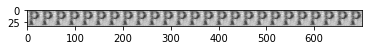

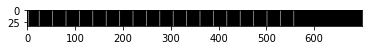

P -> P
P -> P
P -> PN


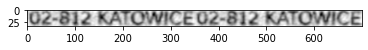

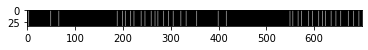

02-812 KATOWICE -> uWvvouux yMx
02-812 KATOWICE -> uWWvvouux yAMA/ xu
02-812 KATOWICE -> uWWvvouux yAMVWA/ xu


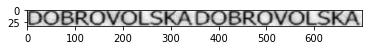

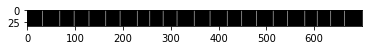

DOBROVOLSKA -> BxRwvwoxLbSxKMw
DOBROVOLSKA -> oxBxRwwvwoxLbSxKMwD
DOBROVOLSKA -> oxBxRwOwvwoxLbSxKMwD


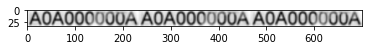

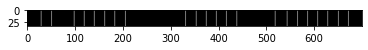

A0A000000A -> woowwoow
A0A000000A -> wmoxmowwwooo
A0A000000A -> wmuoxmowwwooo


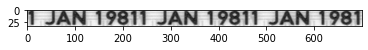

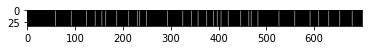

1 JAN 1981 -> Aiw98uwA
1 JAN 1981 -> AMwiwmv9x8u
1 JAN 1981 -> AMwpiwmv9x8wu


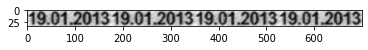

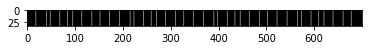

19.01.2013 -> L22oMmm
19.01.2013 -> nwwL22oMmm
19.01.2013 -> nwwL22oMmm


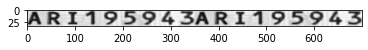

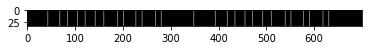

ARI195943 -> R IT1 3935599M
ARI195943 -> R IT11 39x355v99M
ARI195943 -> R 1IT11b 39x355v99w 


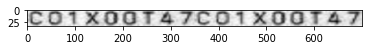

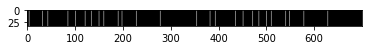

C01X00T47 -> cu)xXo0O0ni
C01X00T47 -> cmu)xxX6o0O0nooip
C01X00T47 -> ccommu)xxX6o0O0nooip


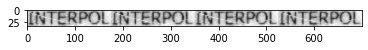

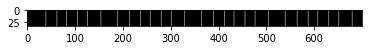

INTERPOL -> RvPnWf
INTERPOL -> VWRvwPnWf
INTERPOL -> VWRvwPnQWf


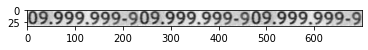

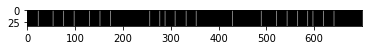

09.999.999-9 -> xwx9 w9xw
09.999.999-9 -> xwx9 qw9xwW3
09.999.999-9 -> xw x9 qw 9xwW


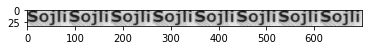

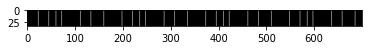

Sojli -> oq6
Sojli -> oqj6
Sojli -> oqjb6


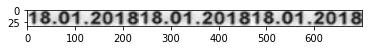

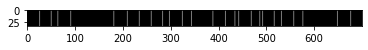

18.01.2018 -> 8u.w1w8MW1w
18.01.2018 -> 8u.w1w8MW1wm8
18.01.2018 -> 8uw.w1w8MW1wm


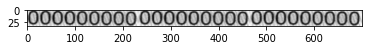

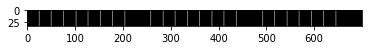

000000000 -> owmowwoowm
000000000 -> owmowwomowm00
000000000 -> owmowwomowm00


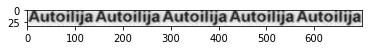

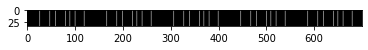

Autoilija -> uAjjm
Autoilija -> uAWjjmW
Autoilija -> umAWjjmW


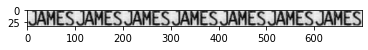

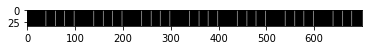

JAMES -> REj
JAMES -> ReESju
JAMES -> ReESju


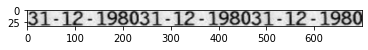

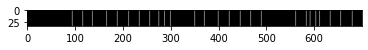

31-12-1980 -> M4y9x8Wom3
31-12-1980 -> M4jy9xw8aWom3
31-12-1980 -> M4jy9xw8aWom3


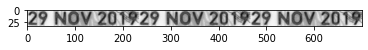

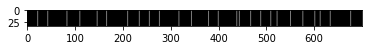

29 NOV 2019 -> 9nmoWvw2Mw2
29 NOV 2019 -> 9mnmoWvw2Mw2x
29 NOV 2019 -> 9mnmoWvw2Mw2x


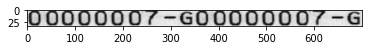

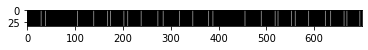

00000007-G -> wwWoo0ouoW7-4Gawo0
00000007-G -> wwWwoo0WouoW7-4Gawo0
00000007-G -> wwWwoo0WouoW7-4Gawo0


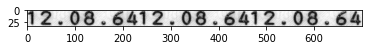

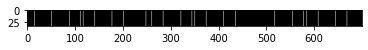

12.08.64 -> 2La6w88w 6
12.08.64 -> 2LVa6w88w, 6
12.08.64 -> 2LVax6w88w, 6


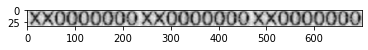

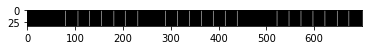

XX0000000 -> oowowWow0w
XX0000000 -> omowowWow0ww
XX0000000 -> ommowwowWow0w


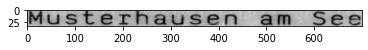

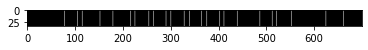

Musterhausen am See -> Wtteuhhaaawuksswen aam
Musterhausen am See -> WtuteurInhhaaawwuuuksswcgueen aame
Musterhausen am See -> WtuteurItnhhaaawwuuurksswcgueeny aawme


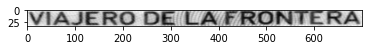

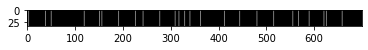

VIAJERO DE LA FRONTERA -> VEmRn pDxxEE( LfmRnomNNMTrtEERR
VIAJERO DE LA FRONTERA -> vVEmRn0o pDxxEE(H LfmRnomNNMTErtEEmRR
VIAJERO DE LA FRONTERA -> vVEmRn0o pDxxEE(H LfmRnomNNMTLErtEEmRR


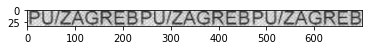

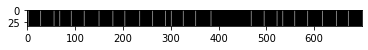

PU/ZAGREB -> PUuuzvzAxR
PU/ZAGREB -> PUuuzvzmAkxR
PU/ZAGREB -> PUuuzvzmAkcxR


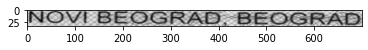

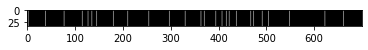

NOVI BEOGRAD, BEOGRAD -> wwWBxEw0GMDr   3 3 BBxEEwaA
NOVI BEOGRAD, BEOGRAD -> wowvMWWIrBxEw0GMDr   3 3 BBMxEEw0aA
NOVI BEOGRAD, BEOGRAD -> wowvMWWIrpBxEw0G MyDr   3 3 BBMxEEw0aA


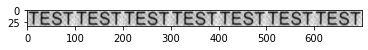

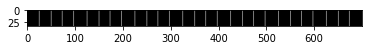

TEST -> ENT
TEST -> EKNmnT
TEST -> EKNmnT


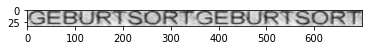

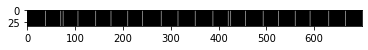

GEBURTSORT -> EEBwBURMTkSxRT
GEBURTSORT -> EEBwBwURMTkSxoR T
GEBURTSORT -> EEwBwBwUWRMTkSxoyR T


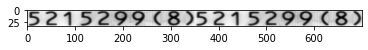

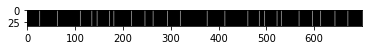

5215299(8) -> p1w5Q2r99w99 wQp
5215299(8) -> p1w5Qp2r99w99x wQp
5215299(8) -> p1w5Qp22r9x9w99x wQ)


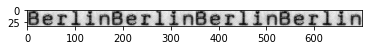

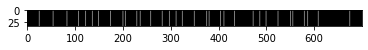

Berlin -> uIHhmnB
Berlin -> uIHThmnBB
Berlin -> uIHThmnmBB


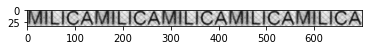

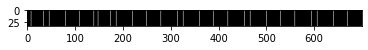

MILICA -> wucuAMM
MILICA -> WwuucuAM
MILICA -> WwuucuuA


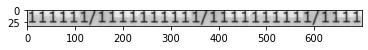

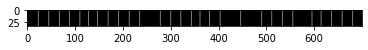

111111/1111 -> mm1/mm
111111/1111 -> m1Hmh1/hmm
111111/1111 -> m1H1mh1/hmm1h


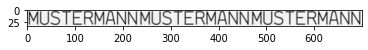

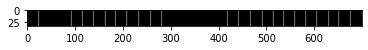

MUSTERMANN -> EaNRMAmNW
MUSTERMANN -> EaNRwMw AmmN
MUSTERMANN -> WEaNRwMw AmmN


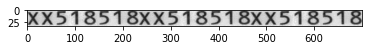

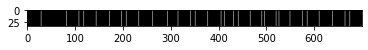

XX518518 -> v11wx1w38X
XX518518 -> v11wx1w38Xu1w
XX518518 -> v11wx1w38Xu1w


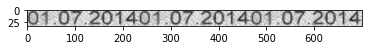

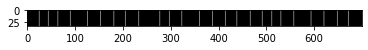

01.07.2014 -> ,w71k4y,
01.07.2014 -> u,wo7 0u1k4a
01.07.2014 -> u,wo7 0u1k4ay


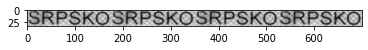

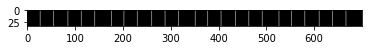

SRPSKO -> RvSxKx
SRPSKO -> RvSxKn0xS
SRPSKO -> RvrSxKn0xS


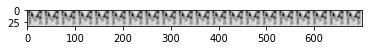

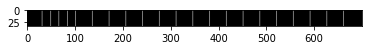

M -> T 
M -> T 
M -> T 


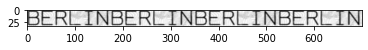

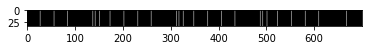

BERLIN -> EARHUNV
BERLIN -> EARHUFNV
BERLIN -> EARHUFNmVw


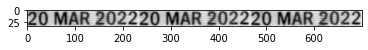

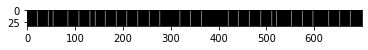

20 MAR 2022 -> onTWARom
20 MAR 2022 -> onTWARRwmom2x
20 MAR 2022 -> onwTWARRwmom2


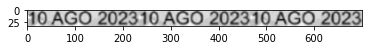

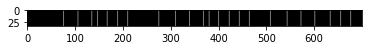

10 AGO 2023 -> u222wGx
10 AGO 2023 -> gw0u24m20w2w
10 AGO 2023 -> gw0u24m20w2w4


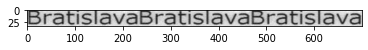

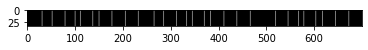

Bratislava -> rmawtsM 9Wwv
Bratislava -> rmauwtsM 9Wwv
Bratislava -> rmauwtsM 9Wwv


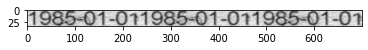

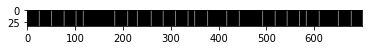

1985-01-01 -> 9W8xW5oWw9
1985-01-01 -> 9xW8xW5 moWww
1985-01-01 -> 9xW8xW5 moWww


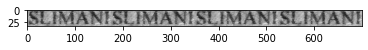

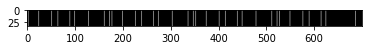

SLIMANI -> slumss
SLIMANI -> sluAAm /bs
SLIMANI -> sluAAm /bs


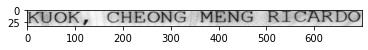

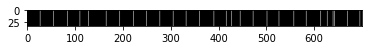

KUOK, CHEONG MENG RICARDO -> UwK  CWNG M ENG MAm DDo
KUOK, CHEONG MENG RICARDO -> UwOK  CwWNWG  M EMNWvG MCAm DDo
KUOK, CHEONG MENG RICARDO -> UwOxK  CwoWNWGV  M EMNWvG( MkCMAm pDDo


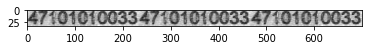

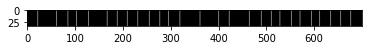

47101010033 -> wwwmxw3x3
47101010033 -> Nww0wwmcxw3xW
47101010033 -> Nww0wwmcxw3xW


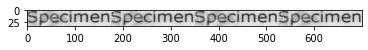

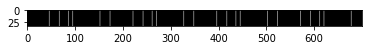

Specimen -> ewcn  
Specimen -> exwcd mn  
Specimen -> exwcd mn  


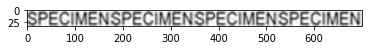

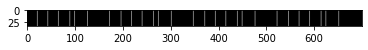

SPECIMEN -> P E4WMm
SPECIMEN -> P E4wWWMA
SPECIMEN -> P E4wWWMAm


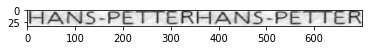

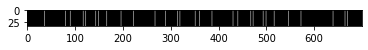

HANS-PETTER -> Asxx.-PEHrEEARM
HANS-PETTER -> Ak6sxx.3-PKEHrEEAARM
HANS-PETTER -> Ak6sxx.3-PKEHrEEAARM


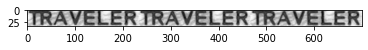

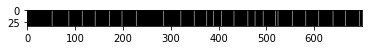

TRAVELER -> AvwElLEFRA
TRAVELER -> AuvwElLLEFRAv
TRAVELER -> AuvwElLLEFRfA


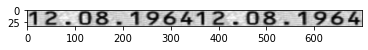

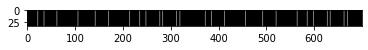

12.08.1964 -> p2NTx8wQ 11wv99xx
12.08.1964 -> p2NTox8wQ 11rwv99xxh
12.08.1964 -> p2NTox8wQ 11rwv99xxh


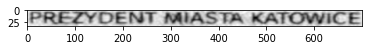

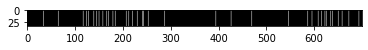

PREZYDENT MIASTA KATOWICE -> RwppDDxEEEHWM1 w0W4rrrc  E
PREZYDENT MIASTA KATOWICE -> RwppDDx)/EEEHHAAWM1 w0W4rrrrcC  E
PREZYDENT MIASTA KATOWICE -> RwpppDDx))/EEEHHAAWRMf1 w0Ww4rrrrcC  E


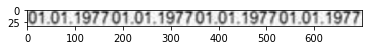

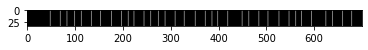

01.01.1977 -> WN9xW7R
01.01.1977 -> WfN9xW7RN
01.01.1977 -> WfpN9xW7rR


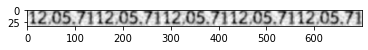

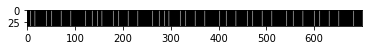

12.05.71 -> o5o
12.05.71 -> upo5  
12.05.71 -> Fupo5  M


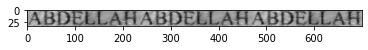

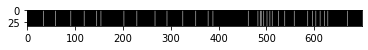

ABDELLAH -> BpDxEaLBpDx
ABDELLAH -> BpDxEaLABpDx
ABDELLAH -> BpDxEamLAvBpD


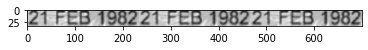

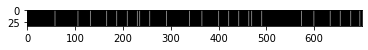

21 FEB 1982 ->  Bj 98QW2
21 FEB 1982 ->  Bj  9x8MQW2
21 FEB 1982 ->  Bj  9x8MQW22


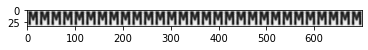

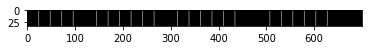

M -> Mm
M -> Mm
M -> Mm


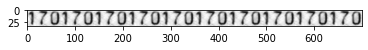

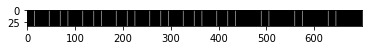

170 -> 7nm
170 -> 7nmm
170 -> 7nmm


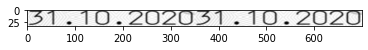

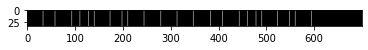

31.10.2020 -> 1TNV1111WW.Vxw3
31.10.2020 -> 1TNV1111woTWW.Vxw3
31.10.2020 -> 1TNV1111woTOWW.V xw3


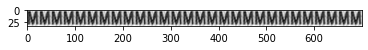

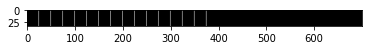

M -> Mn
M -> Mn
M -> Mn


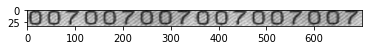

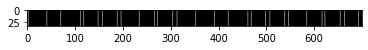

007007007 -> 6077g076
007007007 -> 6OWg0g0077ngw076
007007007 -> 6OWg00g00W77nOgwO076


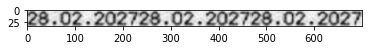

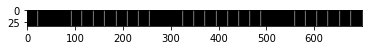

28.02.2027 -> u2xu2x2mu2
28.02.2027 -> u2xu 320x2m/
28.02.2027 -> u2xu 32x0x2jm


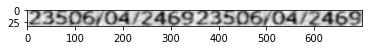

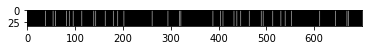

23506/04/2469 ->  o)66   /m44 
23506/04/2469 ->   o )66   /0m 44 
23506/04/2469 ->    oo )66   /0m 443 


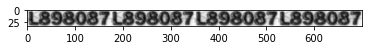

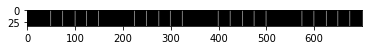

L898087 -> 9x8Mo8v
L898087 -> 9xw8MWox8v
L898087 -> 9xw8MWox8v


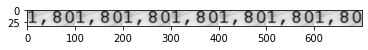

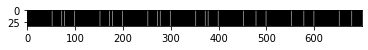

1,80 -> 8wL
1,80 -> 8wo0L
1,80 -> 8wo0LT


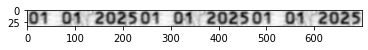

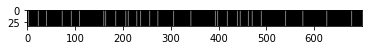

01 01 2025 -> m mmWx
01 01 2025 -> 0m1 OmmWx83
01 01 2025 -> 0m 1 OmmWmWx8


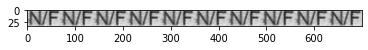

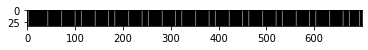

N/F -> vFv
N/F -> vFR
N/F -> vFAR


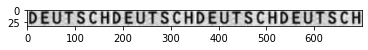

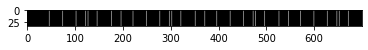

DEUTSCH -> WTSxMHD
DEUTSCH -> WTSSxwMHD
DEUTSCH -> WTSSxwMmHD


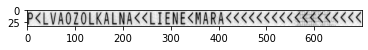

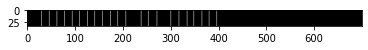

P<LVAOZOLKALNA<<LIENE<MARA<<<<<<<<<<<<<<<<<< -> LmmWmLmmWHmLunRWRKWmnFRmmAF
P<LVAOZOLKALNA<<LIENE<MARA<<<<<<<<<<<<<<<<<< -> LAmmWmNMvuLmmWHmLunRWRKWWmnFwERNwmmAF
P<LVAOZOLKALNA<<LIENE<MARA<<<<<<<<<<<<<<<<<< -> LAmmWmNMvuLmmWHmLunRWRKWWmnFwERNmwmmAF


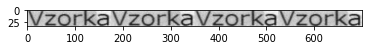

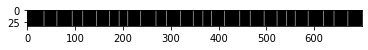

Vzorka -> zgrkMaVw
Vzorka -> zwgrk MaV
Vzorka -> zwgrk ManV


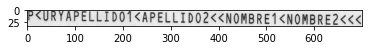

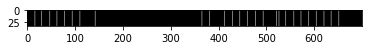

P<URYAPELLIDO1<APELLIDO2<<NOMBRE1<NOMBRE2<<< -> u RMmmoMwmWmownwmmmmmm
P<URYAPELLIDO1<APELLIDO2<<NOMBRE1<NOMBRE2<<< -> xu RMm-WWmoMwfmWBmoawnwmo mmmBmmm
P<URYAPELLIDO1<APELLIDO2<<NOMBRE1<NOMBRE2<<< -> xu RMmw-mWWhmoMwfmWmBmoawnwmo mm mBmmm


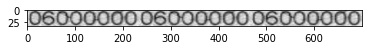

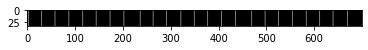

06000000 -> 6owxo
06000000 -> ow6awoxox0wo
06000000 -> ow6awoxox0wow


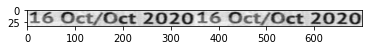

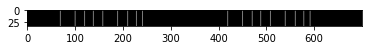

16 Oct/Oct 2020 -> xwawt/cadtx
16 Oct/Oct 2020 -> xwcawtyw/nm0xWcadtx
16 Oct/Oct 2020 -> xwcawtyw/nm0xWcadtix


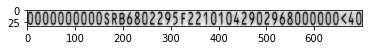

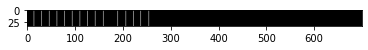

0000000000SRB6802295F22101042902968000000<40 -> wm0mm0wm0m0m0mw00 W86
0000000000SRB6802295F22101042902968000000<40 -> 0wm0mm0wmm0mmm0wmm0m6ww0WW0 WA86
0000000000SRB6802295F22101042902968000000<40 -> 0wwm0mmm0wmm0mmm0wmm0mmm6ww0WW0 WuuA86


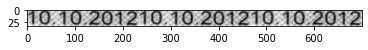

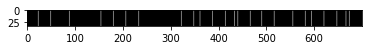

10.10.2012 -> o1w2u2m2xm
10.10.2012 -> ouou1w2ou2m2x
10.10.2012 -> ouou1w2ou2m2x


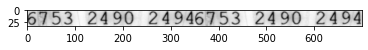

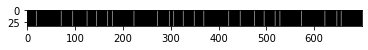

6753 2490 2494 ->  3  w m4WxW
6753 2490 2494 -> x 3  mnnaw m.4WxWw
6753 2490 2494 -> x 3  mnn1aw m.4Wx Ww


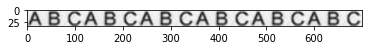

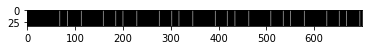

A B C ->  tcB 
A B C ->  tc By 
A B C ->  tc By 


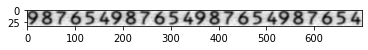

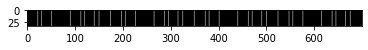

987654 -> p76353g6
987654 -> Wp76S353g
987654 -> Wp76xS353g


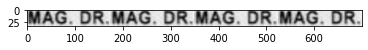

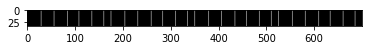

MAG. DR. -> AGp DRiu
MAG. DR. -> AGp DRiuW
MAG. DR. -> AhGp DRiuW


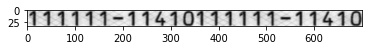

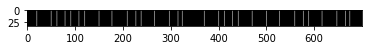

111111-11410 -> j11Hjj1H-Hj15yj1
111111-11410 -> j11HjjW1H-Hj15yj1m
111111-11410 -> yj11HjjW1H-4Hj15yj1m


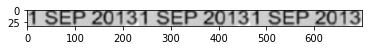

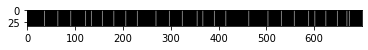

1 SEP 2013 -> SxEP22oWw
1 SEP 2013 -> SxE0P22ouWwf
1 SEP 2013 -> SxE0PX22ouWwf


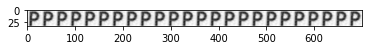

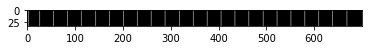

P -> P
P -> P 
P -> P 


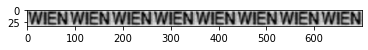

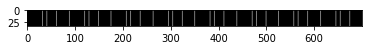

WIEN -> ENW
WIEN -> EENWw
WIEN -> EENmW


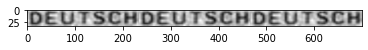

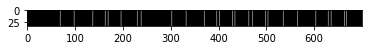

DEUTSCH -> WcMMCxx
DEUTSCH -> WsScMMCWhxxW
DEUTSCH -> WbsScMMCWJhxx


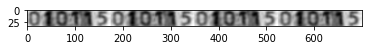

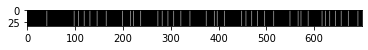

010115 ->   5jy
010115 -> m  yJ5Ijy
010115 -> m  yvJ5Ijy


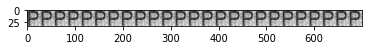

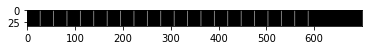

P -> P
P -> Pp
P -> Pp


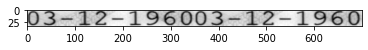

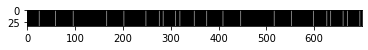

03-12-1960 -> 3.L.199x6666oww3
03-12-1960 -> 3.L.1r99x6666owwx3
03-12-1960 -> 3,.L.1r99xW6666owwx3


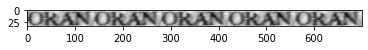

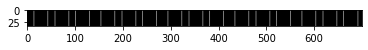

ORAN ->   A 
ORAN ->   v Am 
ORAN ->    v Am 


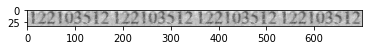

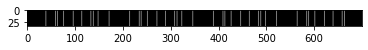

122103512 -> w03W
122103512 -> j ww03bWm
122103512 -> j ww03bbWm


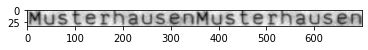

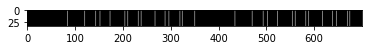

Musterhausen ->  enmhaax9eaeea
Musterhausen ->  eTmnmhaaux39eaeea
Musterhausen ->  eTmnmhaau3x39Beaeea


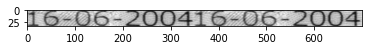

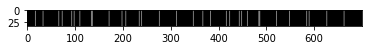

16-06-2004 ->  66(( W66..7wN4q
16-06-2004 ->  66(( WX66..7QwN4jq
16-06-2004 ->  66(( WX66..7QwON4jq


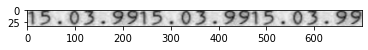

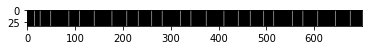

15.03.99 -> 35  ow),39v
15.03.99 -> 35  ow) ,39W
15.03.99 -> 35 , ow) ,39w


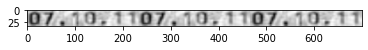

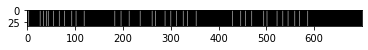

07.10.11 -> 00mJm)K jH
07.10.11 -> 00mJm)K jH1
07.10.11 -> 00WmwJm)K jH1


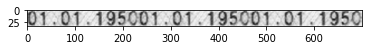

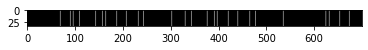

01.01.1950 -> WMM1NgN9x5
01.01.1950 -> WMMj1NgN9x5xW
01.01.1950 -> WMMj1NgN9x 5x


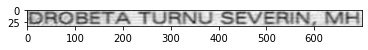

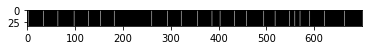

DROBETA TURNU SEVERIN, MH -> D0x8EaTUWRNWU  SxEWEa RWmWM
DROBETA TURNU SEVERIN, MH -> DmRn0x8EaTUWRmNWU  SxEWVVEAa RWmVW/WM
DROBETA TURNU SEVERIN, MH -> DmRn0x8EEaTUWRmNWU  SxEWVVEAa RWmVW/WM


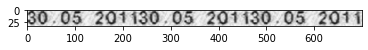

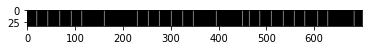

30.05 2011 ->  vW3o v
30.05 2011 -> on  vW3ao  
30.05 2011 -> onu  vwW3aomx


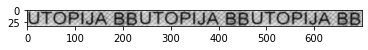

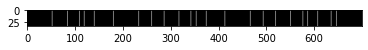

UTOPIJA BB -> PmWAJkuTwP
UTOPIJA BB -> 0PmmWAJkuTw0x
UTOPIJA BB -> 0MPmmWAJkuTw0


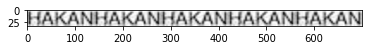

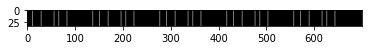

HAKAN -> JWAK<MW
HAKAN -> JWAK<MW
HAKAN -> JWAMK<MW


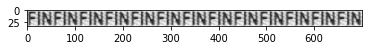

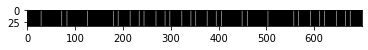

FIN -> vH
FIN -> vM
FIN -> FwW


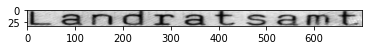

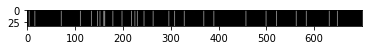

Landratsamt -> l a n1111 aIr m aa s aa m 
Landratsamt -> l aa nm1111 kdaIrr m qaa ss aa m 
Landratsamt -> l aa hnm1111 xkzdaIrr m qaa ss aaa am 


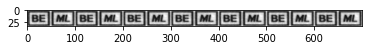

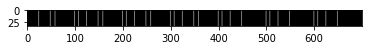

BE ML -> TmEB
BE ML -> qlTmE
BE ML -> qjlTmE


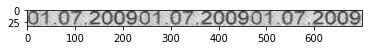

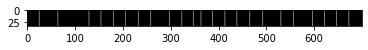

01.07.2009 -> W2w9xo 
01.07.2009 -> iW2xm0w9xiow
01.07.2009 -> iW2xm0w0x9xui


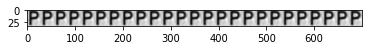

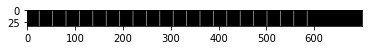

P -> Px
P -> Px
P -> Px


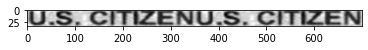

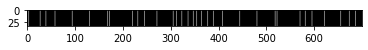

U.S. CITIZEN -> us.39ccHxElNMM
U.S. CITIZEN -> us.3S9 ccHlxElAnNMM
U.S. CITIZEN -> us.3S9 xccHlxElAnNMM


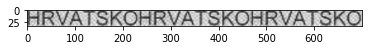

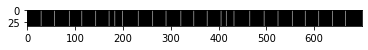

HRVATSKO -> RTSxKQHR
HRVATSKO -> RVVTNSyxKQ0H
HRVATSKO -> RVVTNSyxKQQ0H


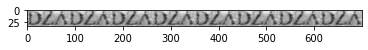

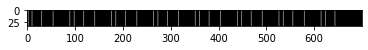

DZA -> D)z4
DZA -> D)z4H
DZA -> D)z4H


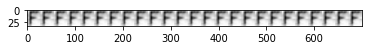

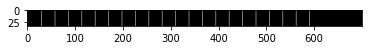

F -> F
F -> Ff
F -> Ff


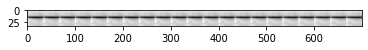

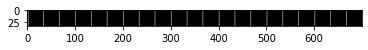

- -> --
- -> --
- -> --


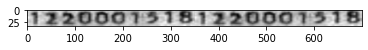

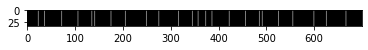

1220001518 -> 112nnw0018WW
1220001518 -> 11u2nn0wm00w1W18WW
1220001518 -> 11u2nn0wm0x0w1W186WW


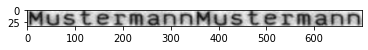

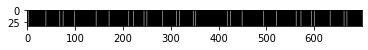

Mustermann -> WsdsWtemaamnnmm
Mustermann -> WusdsWtemnmaamnnmm
Mustermann -> AWusdsWt emnmaamnnmm


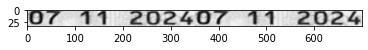

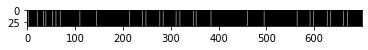

07 11 2024 -> (mm22o0xxr224
07 11 2024 -> (o0mmiL22o0xo0xr224
07 11 2024 -> (o0mmWiL22o0xo0xr2u2


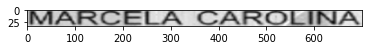

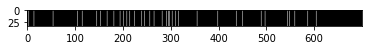

MARCELA CAROLINA -> MVRRccCCtEEEE   lLLuAARRRoOOLu
MARCELA CAROLINA -> MVRRccCCxtEEEE   lLLuuuuCAARRRoOOaLu
MARCELA CAROLINA -> MVRRccCCxtEEEE   ilLLuuuvuCAARRRoOOaLu


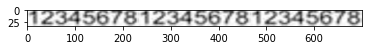

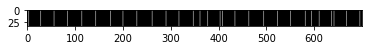

12345678 -> Q2X3W456Q8w2X
12345678 -> Q2X3W4356Q8w2
12345678 -> Q2X3W4356Q8w2


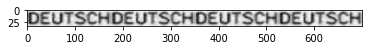

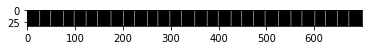

DEUTSCH -> EMbvxD
DEUTSCH -> EMbvSxcD
DEUTSCH -> EwMbvSxcnD


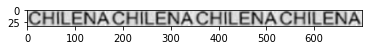

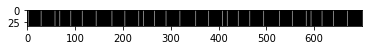

CHILENA -> uLumNA
CHILENA -> HuLuAmNAu
CHILENA -> mHuLuAmNAu


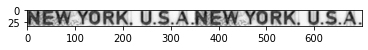

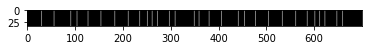

NEW YORK. U.S.A. -> EmWYm(WWuusjA
NEW YORK. U.S.A. -> EmmWYomK(WWuuuksjsAW
NEW YORK. U.S.A. -> EmmWYomK(WWuuuksjsAW


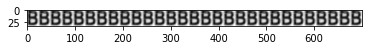

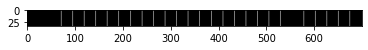

B -> W
B -> MW
B -> MW


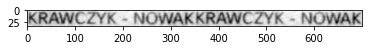

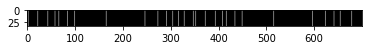

KRAWCZYK - NOWAK ->  R/AAmWWmWmm
KRAWCZYK - NOWAK ->  RW/AAmWWm0vwWmm 
KRAWCZYK - NOWAK ->  RW/AAmWWm0uWvwWmmf 


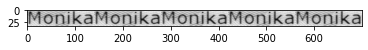

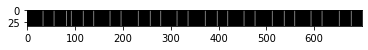

Monika -> mmmkwM
Monika -> wmmmkwm
Monika -> owmmmkwm


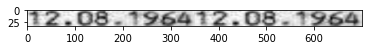

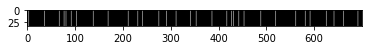

12.08.1964 -> ,jj8 j64j
12.08.1964 -> r,,jjpow8 jyX6,44j
12.08.1964 -> r,,jjpo0w8 jjyX6,44j


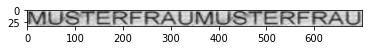

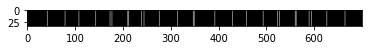

MUSTERFRAU -> UwS TEERRRMAMM
MUSTERFRAU -> UwS T EERRRRMA M
MUSTERFRAU -> UwS T  EERRffRRMA 4M


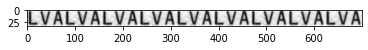

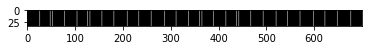

LVA -> vvv
LVA -> vvAh
LVA -> vvAhi


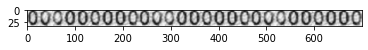

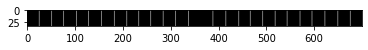

000000000 -> 0owWW0oW
000000000 -> 0owW0WW0W0xoW
000000000 -> 0owW0WW0W0xoW


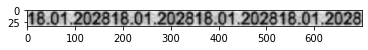

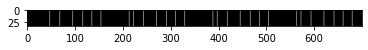

18.01.2028 -> wux2w
18.01.2028 -> wuuxmom2w
18.01.2028 -> wuuxmom2wh


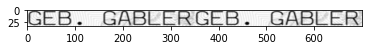

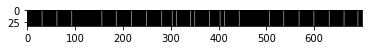

GEB. GABLER -> ErBGMBxLkEARRRrG
GEB. GABLER -> ErB,GMBxLkEAmRRRrc
GEB. GABLER -> ErB,GMmBxLkEAmRRRrcg


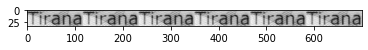

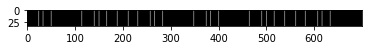

Tirana -> rrmmrr
Tirana -> rrwmmrr
Tirana -> rrwmmrr


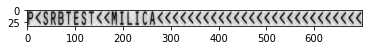

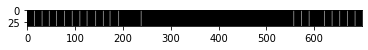

P<SRBTEST<<MILICA<<<<<<<<<<<<<<<<<<<<<<<<<<< -> gswwRBMTwwm<<w<W<WWWxWW<<
P<SRBTEST<<MILICA<<<<<<<<<<<<<<<<<<<<<<<<<<< -> gs wwRmBMwmTwwmmR<<w<xW<WWx(WxWWW<x<
P<SRBTEST<<MILICA<<<<<<<<<<<<<<<<<<<<<<<<<<< -> gs wwRmmBMwmTwwmmR<<Mw<xW<WWx(WxWWW<x<


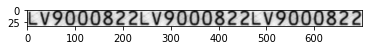

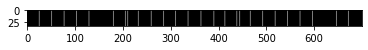

LV9000822 -> xowWx22nMLW
LV9000822 -> vxowoWx22nMLW
LV9000822 -> vxowoWx22nMLW


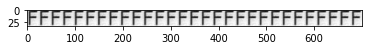

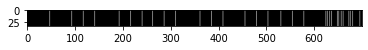

F -> W
F -> WF
F -> WF


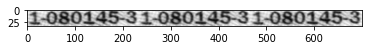

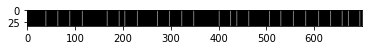

1-080145-3 -> w8aN5j33wR
1-080145-3 -> 0w8a0NR5j33wR
1-080145-3 -> 0w8a0NR5j33wR


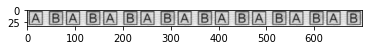

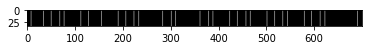

A B -> TNm
A B ->  IaT
A B ->  IaTN


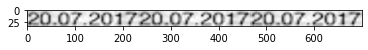

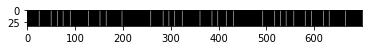

20.07.2017 -> 0mm w2y0
20.07.2017 -> 0mm w2Xy 0 
20.07.2017 -> 0vmm w2Xy  0v


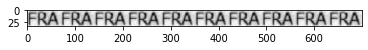

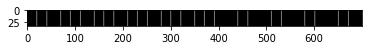

FRA -> RMwM
FRA -> RMwM
FRA -> RMwM


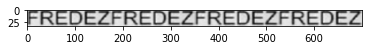

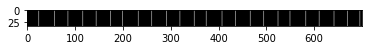

FREDEZ -> EDxEQr
FREDEZ -> EDxEQzrm
FREDEZ -> <EnDxEQzrm


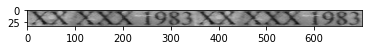

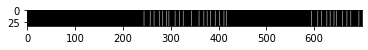

XX XXX 1983 -> wy8y8p3A3 .p
XX XXX 1983 ->  wy8y8p3 A3 .p)
XX XXX 1983 ->   mbwy8y8 p3 n A3 .p


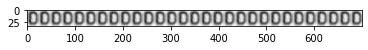

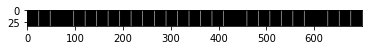

D -> o
D -> on
D -> on


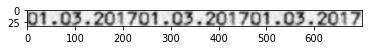

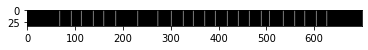

01.03.2017 -> 3X,a20pa
01.03.2017 -> u3X ,a20pa0v
01.03.2017 -> 0u3X ,a20pM1a


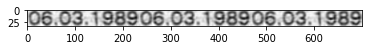

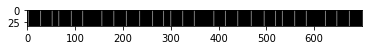

06.03.1989 -> 6u3  9x89
06.03.1989 -> Ow6 .3u3  9x8
06.03.1989 -> Ow6 .3u3  9x8


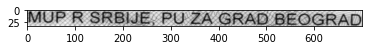

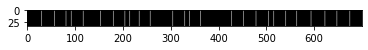

MUP R SRBIJE, PU ZA GRAD BEOGRAD -> UwWPPR3RMWJEUURwADyBwowGRm
MUP R SRBIJE, PU ZA GRAD BEOGRAD -> UwWPPRw3RMWWWJE UURMwADy,BwowGMRm
MUP R SRBIJE, PU ZA GRAD BEOGRAD -> UwWPPH Rw3RMmWWWJE UU RMwAvDy,BwowGMRm


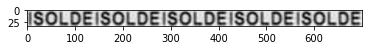

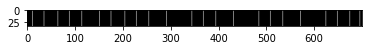

ISOLDE -> oLwDW
ISOLDE -> xWoLwDWH
ISOLDE -> xWoLwDWH


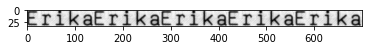

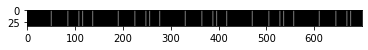

Erika ->  Rkaa4
Erika ->  Rkuaa4
Erika -> i Rkuaa4


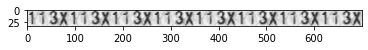

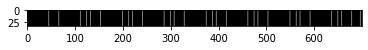

113X -> 3nmn3
113X -> 3nmn3
113X -> 3nmn3


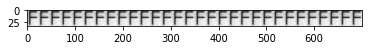

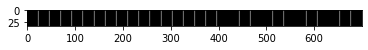

F -> F
F -> FF
F -> FF


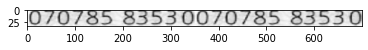

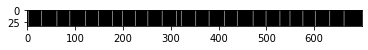

070785 83530 -> 7n7W 83S3Sm
070785 83530 -> 7n07RSWA 3083SA3Som
070785 83530 -> 07n07RSWA 3083SA3Som


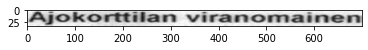

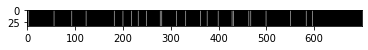

Ajokorttilan viranomainen -> NokwWmiIhaamnm vwiraammoomam
Ajokorttilan viranomainen -> NodkwWmidhIhaamnm vvVwiwraammwwoomam
Ajokorttilan viranomainen -> NodkwWmidhIhaamnm XvvVwiwwraammwwoomam


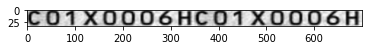

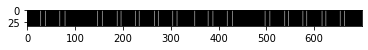

C01X0006H -> 0o6nw0ox66Hw
C01X0006H -> 0o6no6w0wo0x66HRw
C01X0006H -> 0o6no6xw0wo0O0x66HRw


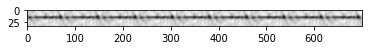

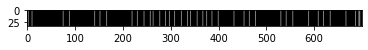

- ->  --
- ->  -- -
- ->  -- -


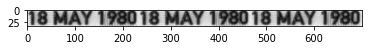

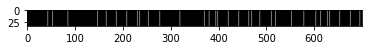

18 MAY 1980 -> M98o0Wnmw
18 MAY 1980 -> nMM98o0uWnmw
18 MAY 1980 -> nMM9w8o0uWnmw


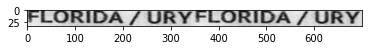

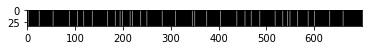

FLORIDA/URY -> LwpD)AAMUWRWy
FLORIDA/URY -> LwWwpD)AAMvUWRWyr
FLORIDA/URY -> lLwOWwpD)AA MvUWRWyr


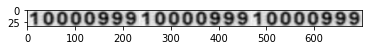

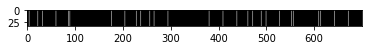

10000999 -> 110x9xw99Wi
10000999 -> 110wx9xw99Wi
10000999 -> 110wx9xw99yWi


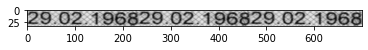

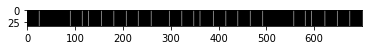

29.02.1968 -> 21w6w8p2w
29.02.1968 -> W2n1 ww6w8p2
29.02.1968 -> W2Zn1 ww6w8pc


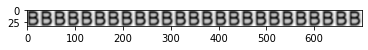

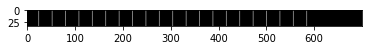

B -> B
B -> B
B -> B 


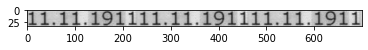

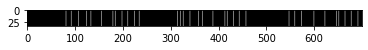

11.11.1911 -> M11r99y 1
11.11.1911 -> mM111r99y W1
11.11.1911 -> mM111r99y W1H


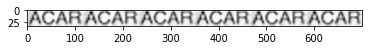

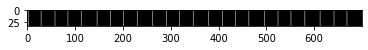

ACAR -> AMAA
ACAR -> AcMAAMA
ACAR -> AcMAAMA


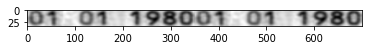

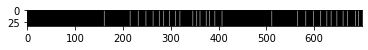

01 01 1980 ->  1 399x8xymxn
01 01 1980 ->  1y 399xx688xyo0mx
01 01 1980 ->  1y 399xx8688xyo0mxn


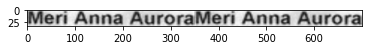

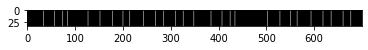

Meri Anna Aurora -> euurmnma4wmwrnor
Meri Anna Aurora -> euurmnma4wmwrnmowra
Meri Anna Aurora -> euurmnma4wmwrnmowara


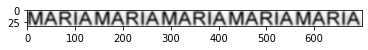

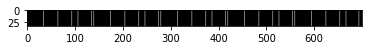

MARIA -> AMRAM
MARIA -> AMMRmAM
MARIA -> AMMRmAMM


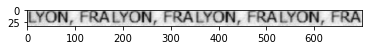

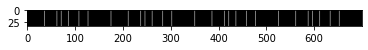

LYON, FRA -> aWNwVv 
LYON, FRA -> aWWNwVv n
LYON, FRA -> 0aWWNwVv n


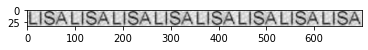

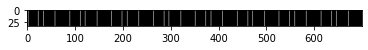

LISA -> kSA
LISA -> kBSAi
LISA -> kBSAi


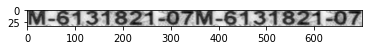

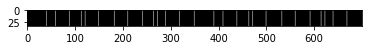

M-6131821-07 -> -6Mw1w8x2k.-vow
M-6131821-07 -> -6MMw1w8x2Tk.4-vow
M-6131821-07 -> -6MMw1w8x2nTk.4-vow7


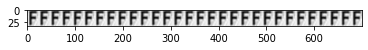

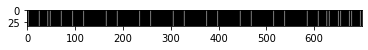

F -> F4
F -> F4
F -> F4


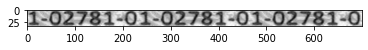

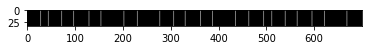

1-02781-0 -> ou2p78WHH
1-02781-0 -> 4ou2p7x8WHxi
1-02781-0 -> 4ou2p7x8WrHxi


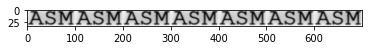

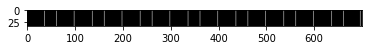

ASM -> SWMmAk
ASM -> SWMmAk
ASM -> SWMmAk


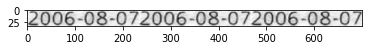

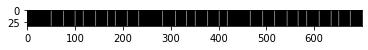

2006-08-07 -> 0wW6(a.00W
2006-08-07 -> 0wW6(aw.0u0W
2006-08-07 -> 0wW6(aw/.0u0W


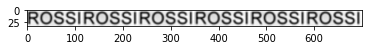

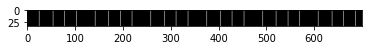

ROSSI -> 0xSS0x
ROSSI -> 0xSS 0x
ROSSI -> 0xSS 0x


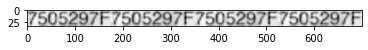

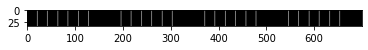

7505297F -> 5aMw295
7505297F -> 5a0Mw W29
7505297F -> 5a0Mw W29w


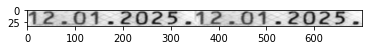

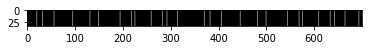

12.01.2025. -> 2x2N.mn0x2x357
12.01.2025. -> 2x2N.wm,2ng0x2Zx357j
12.01.2025. -> 2x2N.wm,2ng0x2Zx357j


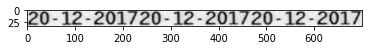

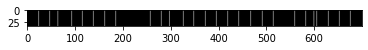

20-12-2017 -> yM2a2noM
20-12-2017 -> oyM42xa2noo
20-12-2017 -> oyM4i2x<a2noP


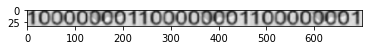

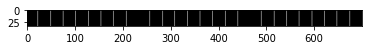

100000001 -> wwwwwowo
100000001 -> w0wow0w0wowo
100000001 -> w0wow0w0wowow


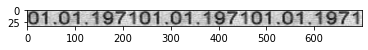

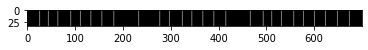

01.01.1971 -> 1,0m1M,j 1
01.01.1971 -> 1L,0mm1M,j 1
01.01.1971 -> 1L, 0mm1M,j 1


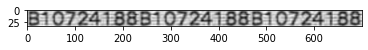

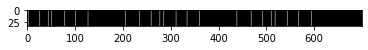

B10724188 -> BM1028n
B10724188 -> BMM 10Wr28n
B10724188 -> BMM 10vWr28nm


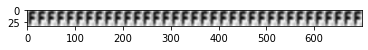

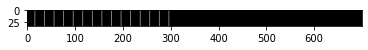

F ->  
F -> / 
F -> / 


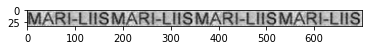

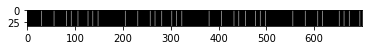

MARI-LIIS -> ARcuWuA
MARI-LIIS -> ARWcuWWuAx
MARI-LIIS -> ARWcuWWuAx


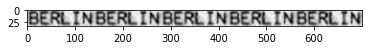

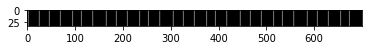

BERLIN -> WERuw
BERLIN -> WEARlufw
BERLIN -> WEARlufw


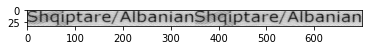

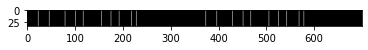

Shqiptare/Albanian -> WWpt meJJ/AW
Shqiptare/Albanian -> WgWpmtw mReJJ/ANW
Shqiptare/Albanian -> WgWpmitw mwReJwJ/ANW


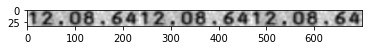

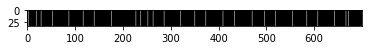

12.08.64 -> 22082
12.08.64 -> w2y2n 0W8 , 
12.08.64 -> w2y2nT 0W8 , 


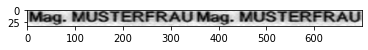

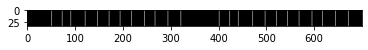

Mag. MUSTERFRAU -> gnLuwSaWTmBRFmMAg
Mag. MUSTERFRAU -> gnLuwuwSaWTmBRFmmMAg
Mag. MUSTERFRAU -> gnLuwuwSaWTmBRFmmMAg


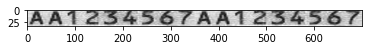

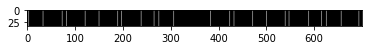

AA1234567 -> MA1w1k2x3455x6n
AA1234567 -> MAA1w1k2x34o655xv6n
AA1234567 -> MAA1w1k2x834o655xv6n


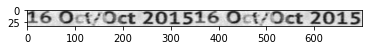

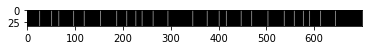

16 Oct/Oct 2015 -> 6x pxtWx<ttp1
16 Oct/Oct 2015 -> 6x p0xtWx<ttpm1
16 Oct/Oct 2015 -> 6(x pv0xtWxw<ttpmB1/


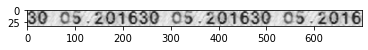

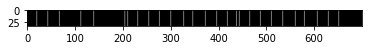

30 05.2016 -> 0  w 36W3
30 05.2016 -> 0  w m36W3xW
30 05.2016 -> 0x  w m36WN3x


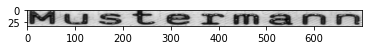

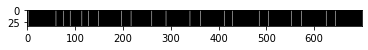

Mustermann ->  uua/ ss 1t ea rF wmn aaa hnn 
Mustermann -> M uuuUjja/ sss 1t ea IrF wmn aaa hnn 
Mustermann -> M uguuUjja/ sss 1t ea IrF wmn aaa hnn 


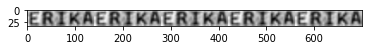

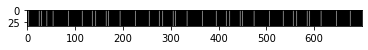

ERIKA -> EEHffR
ERIKA -> EEHffRI
ERIKA -> EEHffRIR


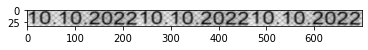

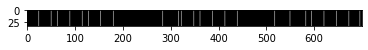

10.10.2022 -> o1wu2mAu
10.10.2022 -> oM4A1w0eu2maA
10.10.2022 -> oM4A1w0eu2maA


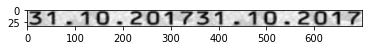

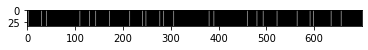

31.10.2017 -> 33N11pow22ngyo1
31.10.2017 -> 33N11pow, 22ngyoam1
31.10.2017 -> 33N11pow, Q22ngyoam1


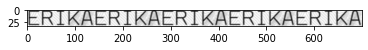

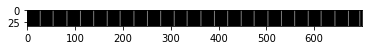

ERIKA -> RMIRKkEA
ERIKA -> RMIRKkEA
ERIKA -> RMIRKkEA


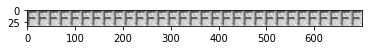

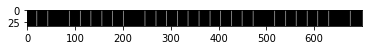

F -> F
F -> Fm
F -> Fm


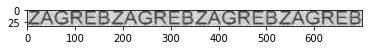

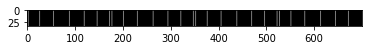

ZAGREB -> AsGxRBx
ZAGREB -> zAsGxRBx
ZAGREB -> zAsGxR<Bxz


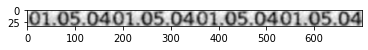

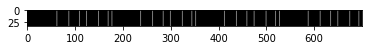

01.05.04 -> M5y,p0a4
01.05.04 -> oM5y,p0a4
01.05.04 -> oM5yg,p0a4


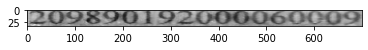

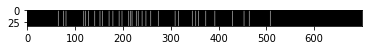

209890192000060009 -> b9x9888 wwwp 999)(((0j9xv0)/m0
209890192000060009 -> b9x9888 wwwp 999)(((O0Wj9xv0)/0mw00
209890192000060009 -> b9x9888 wwwp 999)/(((OO0vWj9xv0)/0mw00


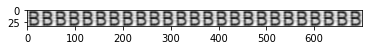

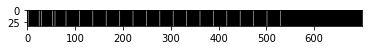

B -> BB
B -> BB
B -> BB


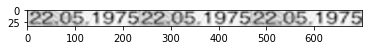

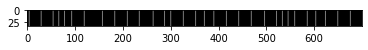

22.05.1975 -> 2x2zn9x7x
22.05.1975 -> 2x2zYnv9x7x2
22.05.1975 -> 2x2zYnv49x7x2


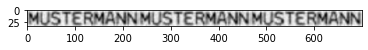

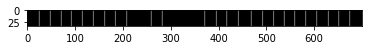

MUSTERMANN -> USMaRMAmNw
MUSTERMANN -> USMaRMwWAmNw
MUSTERMANN -> U6SMaRMwWAmNw


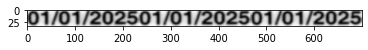

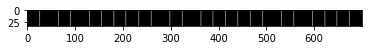

01/01/2025 -> o2nmom2mi
01/01/2025 -> wou2nmom2amio
01/01/2025 -> wowu2nmom2ami


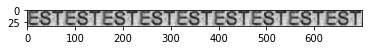

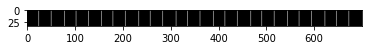

EST -> sTr
EST -> sTr
EST -> sTrss


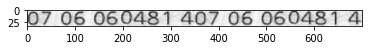

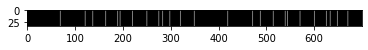

07 06 060481 4 -> xW 0x6a4w88yj4
07 06 060481 4 -> xW pg0x6au04w88yj4
07 06 060481 4 -> xW pg0x6au0m4w88yjV4


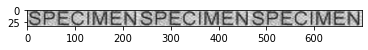

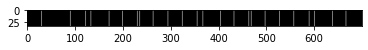

SPECIMEN -> xaRMENNxEw
SPECIMEN -> xcaRMEENNKSx
SPECIMEN -> xcawRMEERNNKS


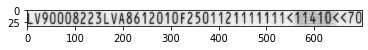

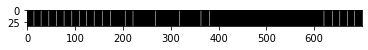

LV90008223LVA8612010F2501121111111<11410<<70 -> VAm9Wmmm0mmT8xmWW8mm0Wwq7
LV90008223LVA8612010F2501121111111<11410<<70 -> VwAm9W  0mmm0mmTT8xmWWW8xmmg0Wwq7
LV90008223LVA8612010F2501121111111<11410<<70 -> VwAm9W  0mmm0mmT0xmT8xmWWW8Txmmmg0Wwq7


In [ ]:
def my_custom_euclidean(x, y):
    return torch.mean(torch.sqrt(torch.sum(torch.square(x-y), dim=-1)))

class CustomActivation(nn.Module):
    def __init__(self, mean=0, std=1, _min=0.0, _max=1.0):
        super(CustomActivation, self).__init__()
        self.mean = mean
        self.std = std
        self.min = _min
        self.max = _max
        
    def forward(self, x):
        gauss = torch.exp((-(x - self.mean)**2)/(2*self.std**2))
        return torch.clamp(gauss, min=self.min, max=self.max)
    
class CustomActivation_inverse_quadratic(nn.Module):
    def __init__(self, epsilon=1):
        super(CustomActivation_inverse_quadratic, self).__init__()
        self.epsilon = epsilon
        
    def forward(self, x):
        return 1/(1 + (self.epsilon*x)**2)
    
class CustomActivation_multiquadratic(nn.Module):
    def __init__(self, epsilon=1):
        super(CustomActivation_multiquadratic, self).__init__()
        self.epsilon = epsilon
        
    def forward(self, x):
        return torch.sqrt(1 + (self.epsilon*x)**2)
    
class CustomActivation_inverse_multiquadratic(nn.Module):
    def __init__(self, epsilon=1):
        super(CustomActivation_inverse_multiquadratic, self).__init__()
        self.epsilon = epsilon
        
    def forward(self, x):
        return 1/torch.sqrt(1 + (self.epsilon*x)**2)
    
def check_accuracy_part34(loader, model):   
    num_correct = 0
    num_samples = 0
    total_loss = []
    orig_ks_loss = [[], []]
    ks_loss = [[], []]
    model.eval()  # set model to evaluation mode
    with torch.no_grad():
        for t, x_y in enumerate(loader):
            x = x_y['image']
            y = x_y['landmark']
            x = x.to(device=device, dtype=dtype)  # move to device, e.g. GPU
            y = y.to(device=device, dtype=torch.float32)
            scores = model(x)
#             loss = torch.dist(scores, y)
#             total_loss.append(loss.item())
            loss = my_custom_euclidean(scores,y)
            total_loss.append(float(loss))
            
    print('train/val loss = %.4f' % (np.mean(np.asarray(total_loss))))
        
               
def flatten(x):
    N = x.shape[0] # read in N, C, H, W
    return x.view(N, -1)  # "flatten" the C * H * W values into a single vector per image

classifier = load_model("classifierpaper_70classes-2-95.34.h5")
model = torch.load("/content/segmenter_gaussian_mse_relu_700.h5")
model.eval()

pkl_file = open('/gdrive/My Drive/datasets/fd.pkl', 'rb')
fd = pickle.load(pkl_file)
pkl_file.close()

pkl_file = open('custom_w_h.pkl', 'rb')
custom_w_h = pickle.load(pkl_file)
pkl_file.close()

fd_min, fd_max, fd_mean, w_h_min, w_h_max, w_h_mean = fd['fd_min'], fd['fd_max'], fd['fd_mean'], fd['w_h_min'], fd['w_h_max'], fd['w_h_mean']


dist_list = []
dist1_list = []
len_list = []
dist_list2 = []
dist1_list2 = []
len_list2 = []
dist_list3 = []
dist1_list3 = []
len_list3 = []
#predict cuts
with torch.no_grad():
    for t, x_y in enumerate(loader_test):
        x = x_y['image']
        y = x_y['landmark']
        x = x.to(device=device, dtype=dtype)  # move to device, e.g. GPU
        y = y.to(device=device, dtype=torch.int16)
        char_val = x_y['value']
        scores_test = model(x)
batch_size, _, ht, wd = x.size()
#convert to numpy
scores_temp = scores_test.cpu().detach().numpy()
scores_temp = scores_temp.reshape((batch_size, -1))

images = x.detach().cpu().detach().numpy()
images = images.reshape((batch_size,ht,wd))

for i in range(batch_size):
    # if i == 1:
    #   break
    image_example = images[i]
    score_example = scores_temp[i]
    plt.figure()
    plt.imshow(image_example, cmap='gray')
    plt.show()
    # orig str
    # char_list = char_list_dict[int(char_val[i])]
    # char_str = ''
    # for c in char_list:
    #     char_str += c
    if y[i] == -1:
      char_str = char_val[i]
    else:
      # char_str=''
      # for _ in range(y[i]):
      #   char_str += char_val[i]
      char_str = char_val[i]
      

    #local maxima indices
    index_P = argrelextrema(score_example, np.greater)[0] #index of local maxima
    index_P_01 = np.zeros(score_example.shape) 
    index_P_01[index_P] = 1 


    #dist between left and right index of cuts
    #len(index_P)xlen(index_P)
    dist = pairwise_distances(np.asarray(index_P).reshape(-1,1), metric='manhattan') 
    #index pairs such that width is betwwen fd-min and fd-max
    # l, r = np.where((dist>= np.min(fd_min)) & (dist<= np.min(fd_max)))
    l, r = np.where((dist>= np.min(custom_w_h)) & (dist<= np.max(custom_w_h)))
    # l, r = np.where((dist/33>= np.min(w_h_min)) & (dist/33<= np.min(w_h_max)))
    #top m = img_width/mean_char_width choices
    l_r = []

    for j in range(len(l)):
        if l[j] < r[j]: #and (index_P[int(r[j])] - index_P[int(l[j])])/33 >= np.mean(w_h_min) and (index_P[int(r[j])] - index_P[int(l[j])])/33 <= np.mean(w_h_max):
            try:
                l_r.append([ index_P[int(l[j])], index_P[int(r[j])], 
                                     score_example[index_P[int(l[j])]] + score_example[index_P[int(r[j])]] ])
            except TypeError:
                print("AAH", l[j], r[j], len(index_P), )

    # l_r = l_r[l_r[:,2].argsort()] #sort according to P(l) +P(r)
    l_r_sorted = sorted(l_r, key = itemgetter(2), reverse=True)

    char_images = []
    segment_list = np.zeros((33,700))
    #top m choices
    
    for _i in range(len(l_r)): # #np.mean(fd_mean))):
        if l_r[_i] in l_r_sorted[0:int(700/np.mean(fd_mean))]:
            img_crop = image_example[:, l_r[_i][0]: l_r[_i][1]]
            img_bin = resize(img_crop, (15,19))
            char_images.append(img_bin)
            segment_list[:, l_r[_i][0]] = 255
            segment_list[:, l_r[_i][1]] = 255
    plt.figure()
    plt.imshow(segment_list, cmap='gray')
    plt.show()
    
    if len(char_images) == 0:
      continue
    X_test = np.asarray(char_images)
    X_test = X_test.reshape((X_test.shape[0], 15, 19, 1))
    class_probs = np.asarray(classifier.predict(X_test))
    max_scores = np.max(class_probs, axis=1)
    max_scores_index = np.argmax(class_probs, axis=1)
    output_str = ''
    for _i in range(len(max_scores_index)):
        if max_scores[_i] < 0.75:
          continue
        s = max_scores_index[_i]
        for k, v in label_map.items():
            if v == s:
                output_str += k
    if y[i] != -1:
      output_str = output_str[0 : int(len(output_str)/y[i])+1]
    print(char_str, "->", output_str)
    dist_list.append(levenshtein_distance(output_str, char_str))
    dist1_list.append(levenshtein_distance(output_str, char_str) * len(char_str))

    len_list.append(len(char_str))
    output_str = ''
    for _i in range(len(max_scores_index)):
        if max_scores[_i] < 0.5:
          continue
        s = max_scores_index[_i]
        for k, v in label_map.items():
            if v == s:
                output_str += k
    if y[i] != -1:
      output_str = output_str[0 : int(len(output_str)/y[i])+1]
    print(char_str, "->", output_str)
    dist_list2.append(levenshtein_distance(output_str, char_str))
    dist1_list2.append(levenshtein_distance(output_str, char_str) * len(char_str))
    len_list2.append(len(char_str))

    len_list.append(len(char_str))
    output_str = ''
    for _i in range(len(max_scores_index)):
        # if max_scores[_i] < 0.75:
        #   continue
        s = max_scores_index[_i]
        for k, v in label_map.items():
            if v == s:
                output_str += k
    if y[i] != -1:
      output_str = output_str[0 : int(len(output_str)/y[i])+1]
    print(char_str, "->", output_str)
    dist_list3.append(levenshtein_distance(output_str, char_str))
    dist1_list3.append(levenshtein_distance(output_str, char_str) * len(char_str))
    len_list3.append(len(char_str))


In [ ]:
print("keep over 0.75")
PCR = 0
for i in range(len(dist_list)):
  PCR += min(dist_list[i], len_list[i])
PCR /= sum(len_list)
PCR = (1 - PCR) * 100

print(PCR) #test-data
print(np.mean(dist_list))
print(np.sum([dist_list[i] * len_list[i] for i in range(len(dist_list))])/ np.sum(len_list))

PCR = 0
for i in range(len(dist_list2)):
  PCR += min(dist_list2[i], len_list2[i])
PCR /= sum(len_list2)
PCR = (1 - PCR) * 100
print("keep over 0.5")
print(PCR) #test-data
print(np.mean(dist_list2))
print(np.sum([dist_list2[i] * len_list2[i] for i in range(len(dist_list2))])/ np.sum(len_list2))

print("keep all")
PCR = 0
for i in range(len(dist_list3)):
  PCR += min(dist_list3[i], len_list3[i])
PCR /= sum(len_list3)
PCR = (1 - PCR) * 100

print(PCR) #test-data
print(np.mean(dist_list3))
print(np.sum([dist_list3[i] * len_list3[i] for i in range(len(dist_list3))])/ np.sum(len_list3))

keep over 0.75
69.13057635949203
8.477064220183486
4.1776294366655815
keep over 0.5
5.633344187561051
10.18960244648318
15.322370563334418
keep all
3.060892217518718
11.033639143730888
16.381634646694888


In [ ]:
y[i]

tensor(3., device='cuda:0')

In [ ]:
#take m segments according to max (p1 + p2 +c)
dist_list4 = []
dist1_list4 = []
len_list4 = []
_fd_min = np.floor(np.mean(fd_min))
_fd_max = np.ceil(np.mean(fd_max))
_fd_mean = np.mean(fd_mean) #[18.18]

#predict cuts
with torch.no_grad():
    for t, x_y in enumerate(loader_test):
        x = x_y['image']
        y = x_y['landmark']
        x = x.to(device=device, dtype=dtype)  # move to device, e.g. GPU
        y = y.to(device=device, dtype=torch.int16)
        char_val = x_y['value']
        scores_test = model(x)
batch_size, _, ht, wd = x.size()
#convert to numpy
scores_temp = scores_test.cpu().detach().numpy()
scores_temp = scores_temp.reshape((batch_size, -1))

images = x.detach().cpu().detach().numpy()
images = images.reshape((batch_size,ht,wd))

for i in range(batch_size):
    image_example = images[i]
    score_example = scores_temp[i]
    
    # orig str
    # char_list = char_list_dict[int(char_val[i])]
    # char_str = ''
    # for c in char_list:
    #     char_str += c
    if y[i] == -1:
      char_str = char_val[i]
    else:
      # char_str=''
      # for _ in range(y[i]):
      #   char_str += char_val[i]
      char_str = char_val[i]
      # char_str = char_val[i]

    #local maxima indices
    index_P = argrelextrema(score_example, np.greater)[0] #index of local maxima
    index_P_01 = np.zeros(score_example.shape) 
    index_P_01[index_P] = 1 


    #dist between left and right index of cuts
    #len(index_P)xlen(index_P)
    dist = pairwise_distances(np.asarray(index_P).reshape(-1,1), metric='manhattan') 
    #index pairs such that width is betwwen fd-min and fd-max
    l, r = np.where((dist>= np.min(fd_min)) & (dist<= np.min(fd_max)))
    #top m = img_width/mean_char_width choices
    l_r = []

    for j in range(len(l)):
        if l[j] < r[j]:
            try:
                l_r.append([ index_P[int(l[j])], index_P[int(r[j])], 
                                     score_example[index_P[int(l[j])]] + score_example[index_P[int(r[j])]] ])
            except TypeError:
                print("AAH", l[j], r[j], len(index_P), )

    # l_r = l_r[l_r[:,2].argsort()] #sort according to P(l) +P(r)
    # l_r_sorted = sorted(l_r, key = itemgetter(2), reverse=True)

    char_images = []
    #top m choices
    for _i in range(len(l_r)): # #np.mean(fd_mean))):
        # if l_r[i] in l_r_sorted[0:int(700/np.mean(fd_mean))]:
        img_crop = image_example[:, l_r[_i][0]: l_r[_i][1]]
        img_bin = resize(img_crop, (15,19))
        char_images.append(img_bin)
    
    if len(char_images) == 0:
      continue
    X_test = np.asarray(char_images)
    X_test = X_test.reshape((X_test.shape[0], 15, 19, 1))
    class_probs = np.asarray(classifier.predict(X_test))
    max_scores = np.max(class_probs, axis=1)
    max_scores_index = np.argmax(class_probs, axis=1)
    for _i in range(len(l_r)):
      l_r[_i][2] /= 2
      l_r[_i][2] += max_scores[_i]
      l_r[_i].append(max_scores_index[_i])
    l_r_sorted = sorted(l_r, key = itemgetter(2), reverse=True)

    output_str = ''
    for _i in range(len(l_r)):
      if l_r[_i] in l_r_sorted[0:int(700/np.mean(fd_mean))]:
        s = l_r[_i][3]
        for k, v in label_map.items():
          if v == s:
            output_str += k

    if y[i] != -1:
      output_str = output_str[0 : int(len(output_str)/y[i])+2]   
    # print(char_str, "->", output_str)
    dist_list4.append(levenshtein_distance(output_str, char_str))
    dist1_list4.append(levenshtein_distance(output_str, char_str) * len(char_str))
    len_list4.append(len(char_str))
    


In [ ]:
PCR = 0
for i in range(len(dist_list4)):
  PCR += min(dist_list4[i], len_list4[i])
PCR /= sum(len_list4)
PCR = (1 - PCR) * 100

print(PCR) #test-data
print(np.mean(dist_list4))
print(np.sum([dist_list4[i] * len_list4[i] for i in range(len(dist_list4))])/ np.sum(len_list4))

8.661673721914687
12.568807339449542
16.1048518397916


In [ ]:
!pip install pytesseract
import pytesseract

  Created wheel for pytesseract: filename=pytesseract-0.3.6-py2.py3-none-any.whl size=13629 sha256=2cfb566c68cce2c0658c4a730433a3d65e1e413a3bd1b6c0ab8f166f38e1689f
  Stored in directory: /root/.cache/pip/wheels/ee/71/72/b98430261d849ae631e283dfc7ccb456a3fb2ed2205714b63f
Successfully built pytesseract


In [ ]:
!sudo apt install tesseract-ocr

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 14 not upgraded.
Need to get 4,795 kB of archives.
After this operation, 15.8 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 tesseract-ocr-eng all 4.00~git24-0e00fe6-1.2 [1,588 kB]
Get:2 http://archive.ubuntu.com/ubuntu bionic/universe amd64 tesseract-ocr-osd all 4.00~git24-0e00fe6-1.2 [2,989 kB]
Get:3 http://archive.ubuntu.com/ubuntu bionic/universe amd64 tesseract-ocr amd64 4.00~git2288-10f4998a-2 [218 kB]
Fetched 4,795 kB in 2s (3,014 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl

In [ ]:
from PIL import Image
# with torch.no_grad():
#     for t, x_y in enumerate(loader_test):
#         x = x_y['image']
#         # y = x_y['landmark']
#         x = x.to(device=device, dtype=dtype)  # move to device, e.g. GPU
#         # y = y.to(device=device, dtype=torch.float32)
#         char_val = x_y['value']
        
# batch_size, _, ht, wd = x.size()

# images = x.detach().cpu().detach().numpy()
# images = images.reshape((batch_size,ht,wd))

for image_name in os.listdir('midv500-textline/'):
  if image_name[-3:] == 'npy':
      
      # flag=0
      # for c in ground_truth[image_name]:
      #   if c not in label_map:
      #     flag = 1
      #     break
      # if flag ==1 or ground_truth[image_name] == '':
      #   continue
      
      image_np = np.load('midv500-textline/' + image_name)
      image_np[image_np < (np.min(image_np) + np.max(image_np))/2] = 0
      image_np[image_np > (np.min(image_np) + np.max(image_np))/2] = np.max(image_np)
      image_example = images[i]
      text = pytesseract.image_to_string(Image.fromarray(image_np, 'L'))
      # os.remove(filename)
      print(text)


 


 
















 

 


 


 






 


 





 

 

 




 


 


eel

 

 


LIE



fae

 






 



    

Wy; ty LIE,

 
  




 



Se ae
Se eee ee

ZZ

Le

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 




 

a


 



COLA tee
COLA tee









 

App bsshehe







 

 



pte

 



 


Ze

eee

as

SL
ee LIE OO EPPO O OE

 

 




 












 




SE




 


 

 


 



 


LELITILELILIT |

SOO

 









 








 

\S
SSS SAMAMYwX'






 

 



 





 


 

 



 

SS

 

eee

 

 

 

 


 

Z|)





 




 




 

 

 


 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 